# <font color=blue size=10> 8th FLAI Machine Learning</font>

# <font color=BLUE size=12> Competition

***
**Author**: [Camila Maestrelli](https://www.linkedin.com/in/camila-maestrelli-leobons/)
***

This is a notebook related to the FLAI MAchine Learning Competition

## Project Steps:


### 1. Problem definition
### 2. Importing the data
### 3. Understanding the data
### 4. Cleaning the data
### 5. EDA 

### 6. Preprocessing
### 7. Algorithm and model criation

### 8. Result Interpretation and model evaluation


## <font color=red>This notebook covers up to the EDA step

## <font color=green> 1. Problem definition

### Competition Goal:
    
    
    Get to a Classifier model with the highest F1-SCORE as possible


### Understanding the metric

![Normal](https://miro.medium.com/max/1314/1*FJNxbk7Ccr1hINGQmgKMcw.jpeg)

- True Positives (TP): when the actual value is Positive and predicted is also Positive.
- True negatives (TN): when the actual value is Negative and prediction is also Negative.
- False positives (FP): When the actual is negative but prediction is Positive. Also known as the Type 1 error
- False negatives (FN): When the actual is Positive but the prediction is Negative. Also known as the Type 2 error

![Normal](https://miro.medium.com/max/1400/1*ICP55HLZ6xxXaUysUU8s2w.jpeg)
![Normal](https://miro.medium.com/max/1170/1*vzCv0_sP9S0OE07wA9wIEQ.jpeg)
![Normal](https://miro.medium.com/max/1360/1*QU9h_Ye6YGrs6wtE94V3WQ.jpeg)
![Normal](https://miro.medium.com/max/1222/1*WLCBBeQHeFoKdOwZP7Wm-w.jpeg)
So, F1 score is a harmonic mean of Precision and Recall
***
#### When to use Accuracy / Precision / Recall / F1-Score?
1. <font color=red>Accuracy</font> is used when the True Positives and True Negatives are more important. Accuracy is a better metric for Balanced Data.
2. Whenever False Positive is much more important use <font color=red>Precision</font>.
3. Whenever False Negative is much more important use <font color=red>Recall</font>.
4. <font color=red>F1-Score</font> is used when the False Negatives and False Positives are important. F1-Score is a better metric for Imbalanced Data.

## Data

- Training Data: (15000, 11) - target “turnover_apos_1_ano” - turnover after 1 year - it´s a employee churn . It informs if the person leaves the company after one year or not
- Test Data: (15000, 10) - does not contain a target column

## <font color=green> 2. Importing the data

In [1]:
# importing the libraries

#!pip install numpy
import numpy as np # linear algebra library
#!pip install pandas
import pandas as pd
pd.set_option('display.max_colwidth', None)

# visualization libraries
#!pip install matplotlib
import matplotlib.pyplot as plt
plt.rcParams.update({
    "font.size": 12,
    "font.weight": "bold", # bold fonts
    "xtick.major.size": 5,
    "xtick.major.pad": 7,
    "xtick.labelsize": 15,  # large tick labels
    "grid.color": "0.5",    # gray gridlines
    "grid.linestyle": "-",  # solid gridlines
    "grid.linewidth": 0.5,  # thin gridlines
    "lines.linewidth": 1, # 
    "lines.color": "g",   # green lines
    "savefig.dpi": 300,     # higher resolution output.
})    
from matplotlib.gridspec import GridSpec
#!pip install seaborn
import seaborn as sns
#!pip install sweetviz
import sweetviz as sv


# Machine Learning library - Classification

from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB
from sklearn.naive_bayes import MultinomialNB
from sklearn.linear_model import SGDClassifier
from sklearn.ensemble import GradientBoostingClassifier
#!pip install lightgbm
from lightgbm import LGBMClassifier
#!pip install xgboost
from xgboost import XGBClassifier

from sklearn.ensemble import VotingClassifier
from sklearn.ensemble import BaggingClassifier
from sklearn.ensemble import StackingClassifier

#!pip install pycaret
#from pycaret.classification import *

# tree plot
from sklearn.tree import plot_tree
#!pip install graphviz==0.19.1
#!apt-get install graphviz
#from sklearn.tree import export_graphviz
#import graphviz

# validation
from sklearn.model_selection import cross_validate, RepeatedStratifiedKFold, RepeatedKFold, KFold, cross_val_predict
from sklearn.model_selection import train_test_split, GridSearchCV, RandomizedSearchCV

#!pip install optuna
import optuna

# transformations
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import MaxAbsScaler
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import RobustScaler # used when there are many outliers
from sklearn.preprocessing import Normalizer
from sklearn.preprocessing import QuantileTransformer # the “n_quantiles” argument must be set to a value less than the number of observations in the training dataset
from sklearn.preprocessing import PowerTransformer

# Encoding
!pip install category_encoders
import category_encoders as ce  
from sklearn.preprocessing import OneHotEncoder # transform 1 column into x columns where x is the amount of unique values
from sklearn.preprocessing import OrdinalEncoder # transform a categorical variable into a numerical integer sorted by alphabetical order
from sklearn.preprocessing import PolynomialFeatures
from sklearn.preprocessing import LabelBinarizer
from sklearn.preprocessing import LabelEncoder # tranform a categorical target variable into a numerical integer sorted by alphabetical order

# classification taking the probability classification into account
from sklearn.preprocessing import Binarizer

# Make your own function to tranform or encode your data
from sklearn.preprocessing import FunctionTransformer
 
# Imputers
from sklearn.impute import SimpleImputer, KNNImputer 

# Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.feature_selection import SelectFromModel

# metrics
from sklearn.metrics import f1_score
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score
from sklearn.metrics import balanced_accuracy_score
from sklearn.metrics import recall_score
# roc curves
from sklearn.metrics import plot_roc_curve, plot_precision_recall_curve, roc_curve


# anova testing
#!pip install scipy
import scipy.stats as stats

import warnings
warnings.filterwarnings("ignore")

from datetime import datetime

  Using cached packaging-21.3-py3-none-any.whl (40 kB)
  Attempting uninstall: packaging
    Found existing installation: packaging 20.9
    Uninstalling packaging-20.9:


ERROR: Could not install packages due to an OSError: [WinError 5] Acesso negado: 'c:\\programdata\\anaconda3\\lib\\site-packages\\packaging-20.9.dist-info\\direct_url.json'
Consider using the `--user` option or check the permissions.



In [120]:
#!pip install pycaret --user
#from pycaret.classification import *

In [2]:
!pip list

Package                            Version
---------------------------------- -------------------
-                                  rkupsafe
-.ckaging                          20.9
-ackaging                          20.9
-arkupsafe                         1.1.1
-ckaging                           20.9
alabaster                          0.7.12
alembic                            1.7.7
altair                             4.2.0
anaconda-client                    1.7.2
anaconda-navigator                 2.1.1
anaconda-project                   0.9.1
anyio                              2.2.0
appdirs                            1.4.4
argh                               0.26.2
argon2-cffi                        20.1.0
asn1crypto                         1.4.0
astor                              0.8.1
astroid                            2.5
astropy                            4.2.1
async-generator                    1.10
atomicwrites                       1.4.0
attrs                              20.3.0

tabula-py                          2.3.0
tabulate                           0.8.9
tangled-up-in-unicode              0.1.0
tblib                              1.7.0
tenacity                           8.0.1
terminado                          0.9.4
testpath                           0.4.4
textblob                           0.17.1
textdistance                       4.2.1
thinc                              7.4.5
threadpoolctl                      2.1.0
three-merge                        0.1.1
tifffile                           2021.4.8
toml                               0.10.2
toolz                              0.11.1
tornado                            6.1
tqdm                               4.59.0
traitlets                          5.0.5
typed-ast                          1.4.2
typing-extensions                  3.7.4.3
tzdata                             2021.5
tzlocal                            4.1
ujson                              4.0.2
umap-learn                         0.5.2
unicodecsv

In [3]:
train_url = 'https://raw.githubusercontent.com/camilamaestrelli/Employee-Churn-Classification-Competition/main/treino.csv'
test_url = 'https://raw.githubusercontent.com/camilamaestrelli/Employee-Churn-Classification-Competition/main/teste.csv'

# importing the datasets
original_train = pd.read_csv(train_url, sep = ';', decimal = ',')
original_test = pd.read_csv(test_url, sep = ';', decimal = ',')

# copying the datsets
df_train = original_train.copy()
df_test = original_test.copy()

## <font color=green> 3. Understanding the data

In [4]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15000 entries, 0 to 14999
Data columns (total 11 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   func_sexo               15000 non-null  object 
 1   func_idade              15000 non-null  int64  
 2   func_racacor            15000 non-null  object 
 3   func_escolaridade       15000 non-null  object 
 4   func_uf                 15000 non-null  object 
 5   func_deficiencia        15000 non-null  object 
 6   empresa_porte           15000 non-null  object 
 7   empresa_setor           15000 non-null  object 
 8   contrato_horastrabalho  15000 non-null  int64  
 9   contrato_salario        15000 non-null  float64
 10  turnover_apos_1_ano     15000 non-null  object 
dtypes: float64(1), int64(2), object(8)
memory usage: 1.3+ MB


In [5]:
df_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15000 entries, 0 to 14999
Data columns (total 10 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   func_sexo               15000 non-null  object 
 1   func_idade              15000 non-null  int64  
 2   func_racacor            15000 non-null  object 
 3   func_escolaridade       15000 non-null  object 
 4   func_uf                 15000 non-null  object 
 5   func_deficiencia        15000 non-null  object 
 6   empresa_porte           15000 non-null  object 
 7   empresa_setor           15000 non-null  object 
 8   contrato_horastrabalho  15000 non-null  int64  
 9   contrato_salario        15000 non-null  float64
dtypes: float64(1), int64(2), object(7)
memory usage: 1.1+ MB


In [6]:
df_train.describe()

,func_idade,contrato_horastrabalho,contrato_salario
count,15000.000000,15000.000000,15000.000000
mean,32.530133,40.403733,1953.761159
std,9.719180,9.156334,2528.049863
min,16.000000,0.000000,299.400000
25%,25.000000,44.000000,1079.227500
50%,31.000000,44.000000,1433.055000
75%,38.000000,44.000000,1932.750000
max,82.000000,44.000000,98641.650000


In [7]:
df_train.select_dtypes(include='object').describe()

,func_sexo,func_racacor,func_escolaridade,func_uf,func_deficiencia,empresa_porte,empresa_setor,turnover_apos_1_ano
count,15000,15000,15000,15000,15000,15000,15000,15000
unique,2,4,5,9,2,9,6,2
top,MASCULINO,PRETA-PARDA,MEDIO COMPLETO,BA,NAO,DE 20 A 49,Serviços,NAO
freq,8925,9682,9116,4223,14736,2466,7903,9599


In [8]:
# categorical features
cat_features = df_train.select_dtypes(include='object').columns.values
cat_features

array(['func_sexo', 'func_racacor', 'func_escolaridade', 'func_uf',
       'func_deficiencia', 'empresa_porte', 'empresa_setor',
       'turnover_apos_1_ano'], dtype=object)

In [9]:
ordinal_features = ['func_escolaridade', 'empresa_porte']
target = ['turnover_apos_1_ano']

In [10]:
nominal_features = list(set(cat_features) - set(ordinal_features) - set(target))
nominal_features

['func_sexo', 'func_uf', 'func_deficiencia', 'func_racacor', 'empresa_setor']

In [11]:
numerical_features = list(df_train.select_dtypes(exclude='object').columns.values)
numerical_features

['func_idade', 'contrato_horastrabalho', 'contrato_salario']

In [12]:
for coluna in df_train.columns:
    print(coluna, ':', df_train[coluna].nunique())
    print(df_train[coluna].unique())
    print('------------------------------------')

func_sexo : 2
['MASCULINO' 'FEMININO']
------------------------------------
func_idade : 62
[24 25 54 40 28 34 23 37 39 53 51 26 27 20 41 47 30 33 36 22 18 29 59 31
 49 38 61 35 66 19 48 21 57 32 63 52 42 46 43 60 50 45 64 44 62 56 55 67
 58 65 71 17 79 69 75 70 68 74 72 76 82 16]
------------------------------------
func_racacor : 4
['AMARELA-BRANCA' 'SEM INFO' 'PRETA-PARDA' 'INDIGENA']
------------------------------------
func_escolaridade : 5
['MEDIO COMPLETO' 'ANALFABETO-FUND_INCOMPLETO' 'SUPERIOR_COMPLETO'
 'FUND_COMPLETO-MEDIO_INCOMPLETO' 'SUPERIOR_INCOMPLETO']
------------------------------------
func_uf : 9
['RN' 'BA' 'SE' 'PE' 'CE' 'MA' 'PI' 'PB' 'AL']
------------------------------------
func_deficiencia : 2
['NAO' 'SIM']
------------------------------------
empresa_porte : 9
['DE 10 A 19' 'ATE 4' 'DE 20 A 49' 'DE 5 A 9' '1000 OU MAIS'
 'DE 500 A 999' 'DE 50 A 99' 'DE 100 A 249' 'DE 250 A 499']
------------------------------------
empresa_setor : 6
['Serviços' 'Comércio' 'Con

In [13]:
for coluna in df_test.columns:
    print(coluna, ':', df_test[coluna].nunique())
    print(df_test[coluna].unique())
    print('------------------------------------')

func_sexo : 2
['FEMININO' 'MASCULINO']
------------------------------------
func_idade : 63
[30 21 26 49 31 23 35 41 43 45 19 42 33 29 34 24 25 36 20 38 44 39 40 68
 32 57 37 28 27 56 63 50 22 72 47 48 52 51 46 59 53 18 54 60 61 55 58 67
 66 64 65 69 62 71 70 76 75 85 73 74 79 17 16]
------------------------------------
func_racacor : 4
['PRETA-PARDA' 'SEM INFO' 'AMARELA-BRANCA' 'INDIGENA']
------------------------------------
func_escolaridade : 5
['MEDIO COMPLETO' 'ANALFABETO-FUND_INCOMPLETO' 'SUPERIOR_COMPLETO'
 'FUND_COMPLETO-MEDIO_INCOMPLETO' 'SUPERIOR_INCOMPLETO']
------------------------------------
func_uf : 9
['MA' 'BA' 'RN' 'PE' 'CE' 'SE' 'PB' 'AL' 'PI']
------------------------------------
func_deficiencia : 2
['NAO' 'SIM']
------------------------------------
empresa_porte : 9
['ATE 4' 'DE 5 A 9' 'DE 50 A 99' '1000 OU MAIS' 'DE 100 A 249'
 'DE 250 A 499' 'DE 10 A 19' 'DE 500 A 999' 'DE 20 A 49']
------------------------------------
empresa_setor : 6
['Comércio' 'Indústria' 

#### OBS:
Analysing the information above, it can be observed that:
1. There is no null data
2. There are 10 variables and 1 target:



## Variables

> ### func_sexo
dummy/binary/dichotomous variable
> ***

|Description|Translation|
|---|---|
|FEMININO|Female|
|MASCULINO|Male|

> ### func_idade
numerical variable - Discrete - Age in years
> ***



> ### func_racacor
categorical/ qualitative nominal variable - race
> ***

|Description|Translation|
|---|---|
|PRETA-PARDA|Black-Brown|
|SEM INFO|No Information|
|AMARELA-BRANCA|Asian-White|
|INDIGENA|Indian-Native|

> ### func_escolaridade 
categorical ordinal variable - education level - can be transformed into a numerical variable
> ***

|Description|Translation|Code|
|---|---|---|
|ANALFABETO-FUND_INCOMPLETO|Unlettered-incomplete Elementary School|1
|FUND_COMPLETO-MEDIO_INCOMPLETO|Elementary School-incomplete High School|2|
|MEDIO COMPLETO|High School|3
|SUPERIOR_INCOMPLETO|Undergraduate|4
|SUPERIOR_COMPLETO|College degree|5|


> ### func_uf - state 
categorical nominal variable - Northeast brazilian states
> ***


|Description|Translation|IBGE Code|
|---|---|---|
|MA|Maranhão|21|
|BA|Bahia|29|
|RN|Rio Grande do Norte|24|
|PE|Pernambuco|26|
|CE|Ceará|23|
|SE|Sergipe|SE|
|PB|Paraíba|PB|
|AL|Alagoas|AL|
|PI|Piauí|PI|



> ### func_deficiencia
dummy/binary/dichotomous variable - if the person has a deficiency
> ***

|Description|Translation|Code|
|---|---|---|
|NAO|NO|0|
|SIM|YES|1|


> ### empresa_porte
categorical/qualitative ordinal - company size - can be transformed to a numerical variable as well
> ***

 
|Description|Translation|Code|
|---|---|---|
|ATE 4|1 - 4 employees|1|
|DE 5 A 9|5 - 9 employees|2|
|DE 10 A 19|10 - 19 employees|3|
|DE 20 A 49|20 - 49 employees|4|
|DE 50 A 99|50 - 99 employees|5|
|DE 100 A 249|100 - 249 employees|5|
|DE 250 A 499|250 - 499 employees|7|
|DE 500 A 999|500 - 999 employees|8|
|1000 OU MAIS|1,000+ employees|9|


> ### contrato_horastrabalho
numerical variable - Discrete - Weekly working hours

> ***




> ### contrato_salario
numerical variable - continuous - Wage
> ***



> ### turnover_apos_1_ano
dummy/binary/dichotomous variable - target - turnover after 1 year
> ***

|Description|Translation|Code|
|---|---|---|
|NAO|NO|0|
|SIM|YES|1|

## <font color=green> 4. Cleaning the data

At first, it is assumed that there is no data to clean as there is no null data or 'strange' values (incomplete, irrelevant, duplicated, or improperly formatted) that needs to be adressed

## <font color=green> 5. EDA: Exploratory Data Analysis

The data visualization using sweetviz 

                                             |                                             | [  0%]   00:00 ->…


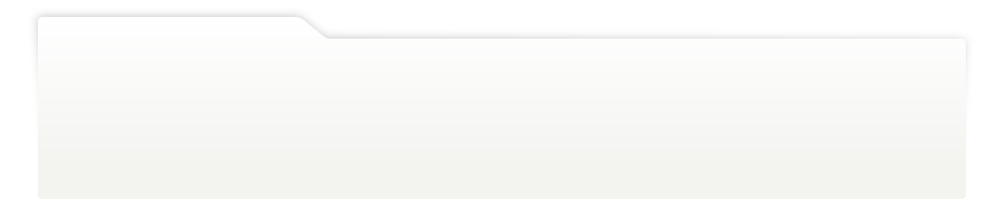
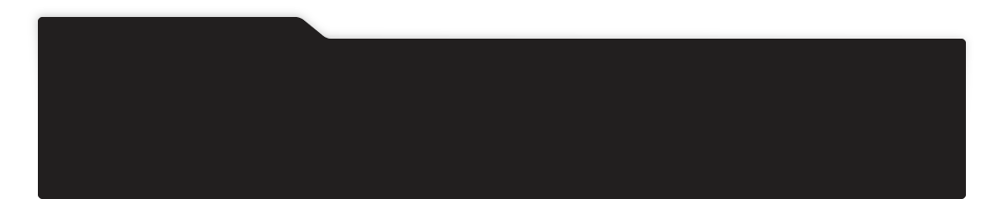
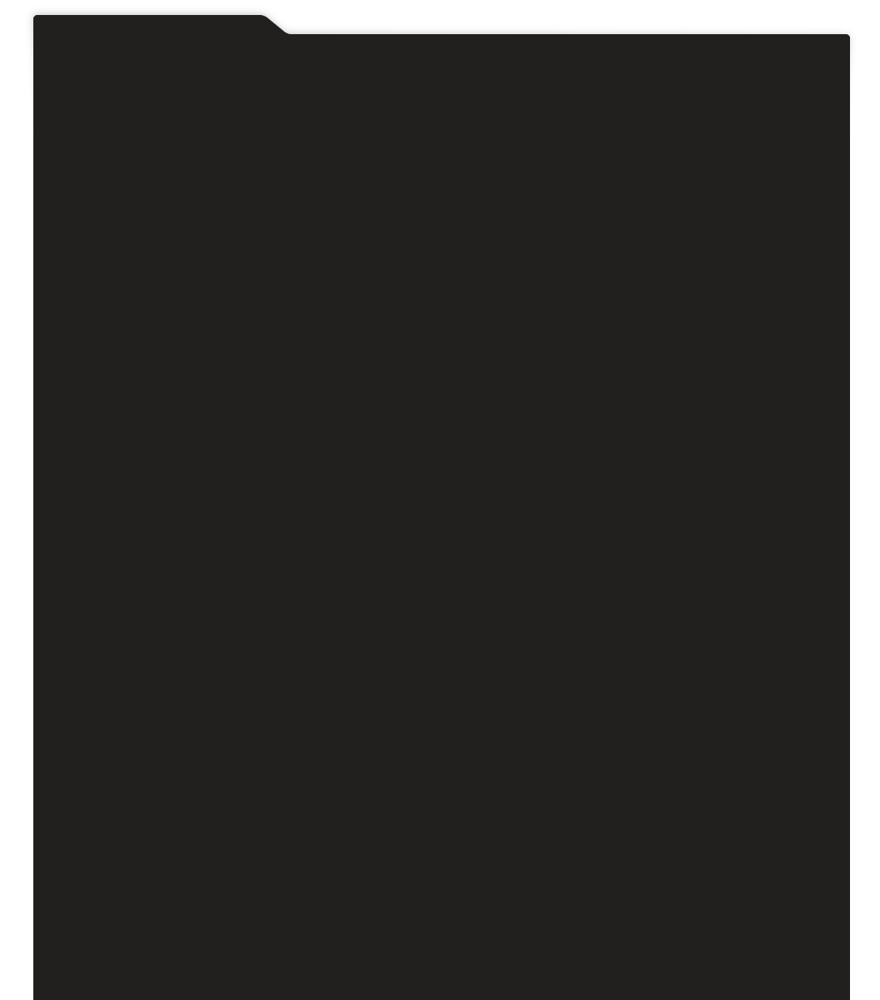
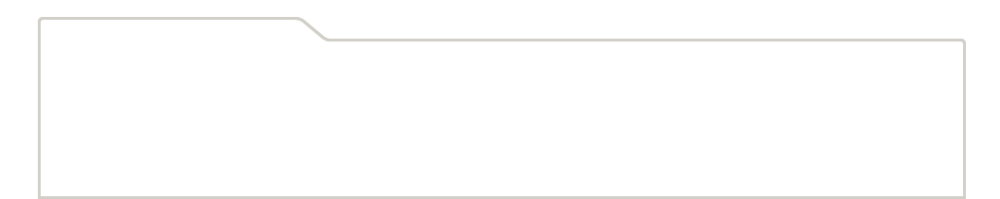
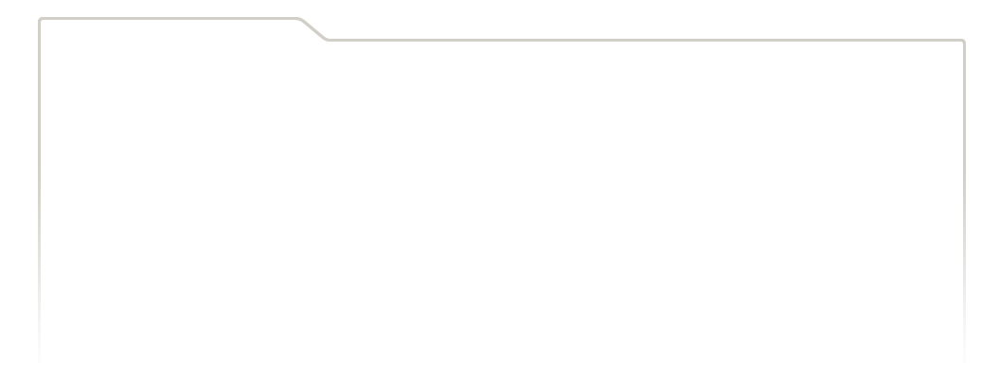
...
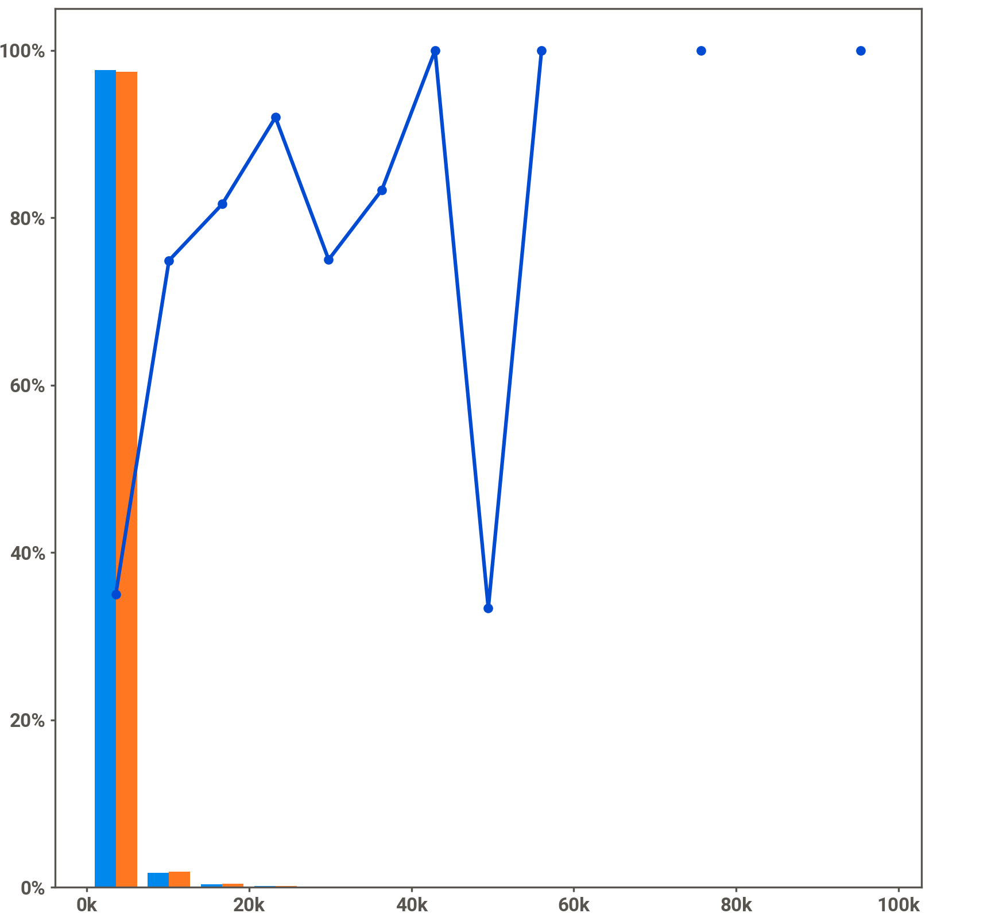
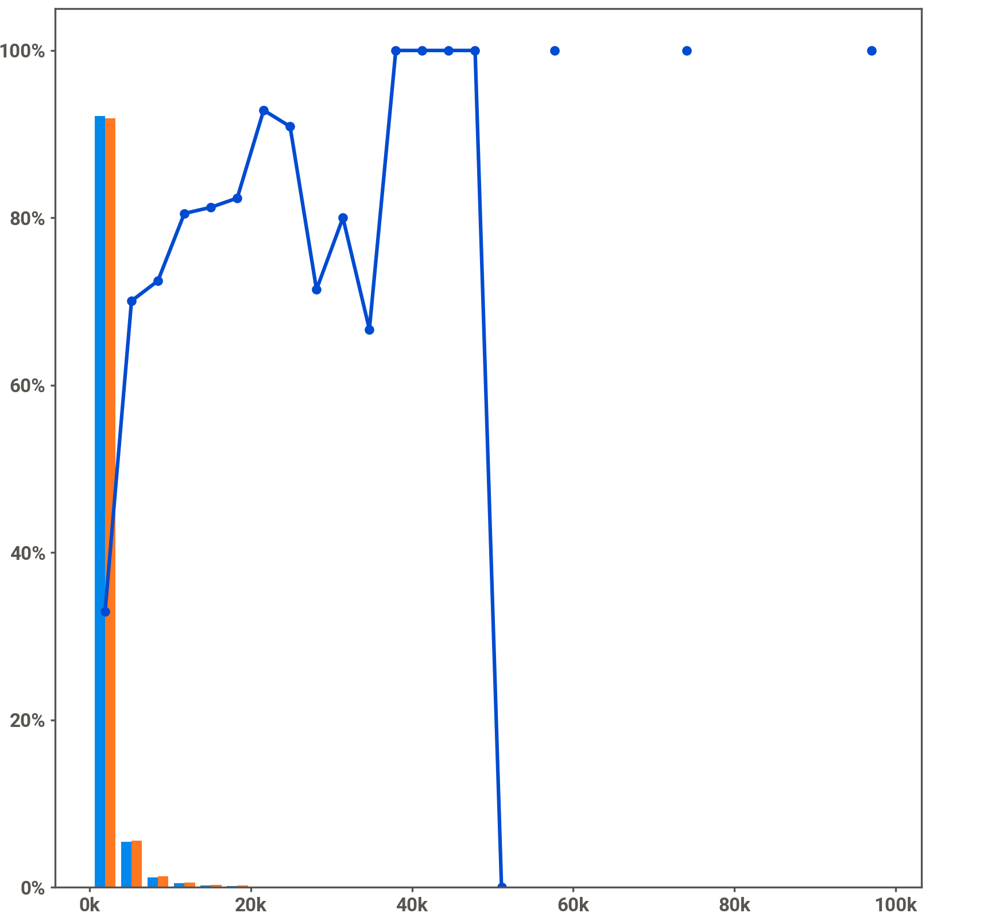
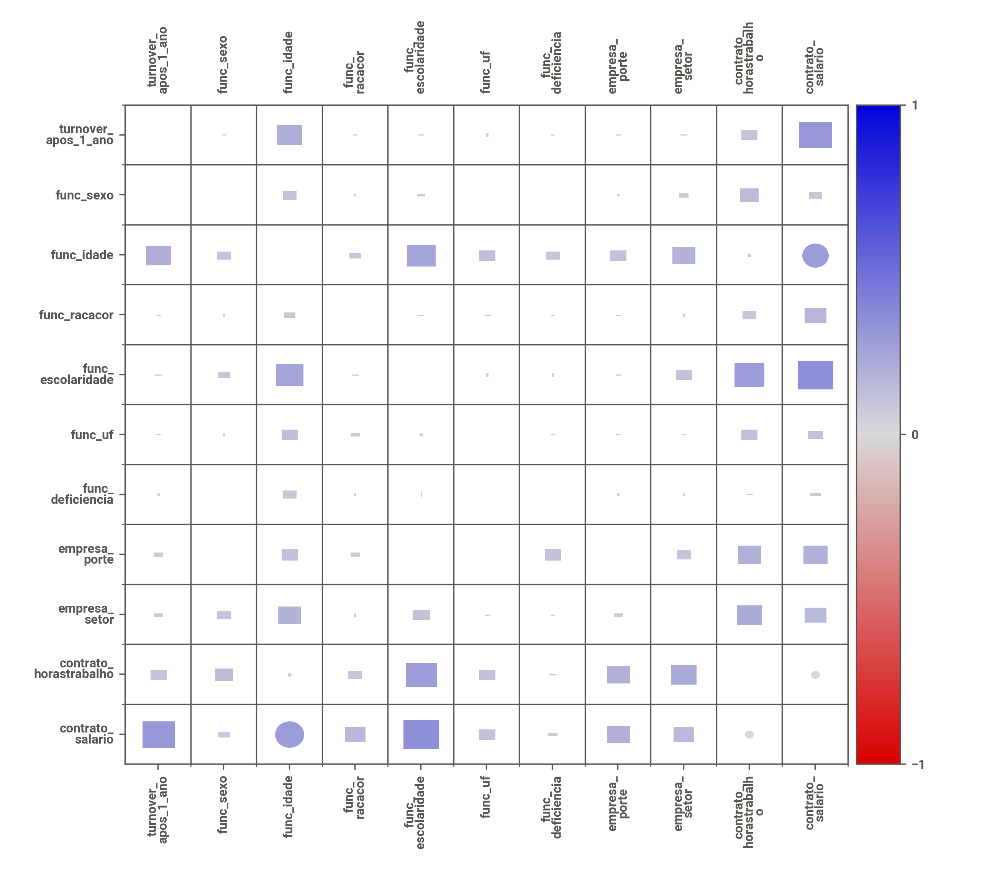
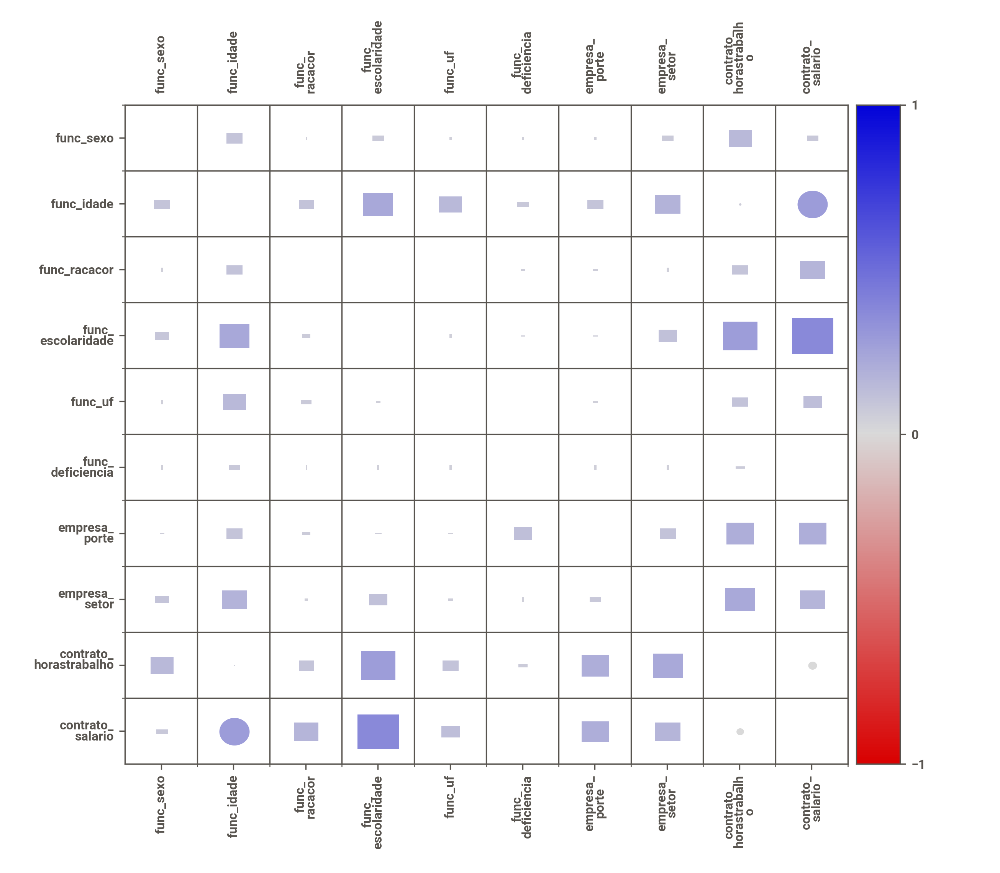
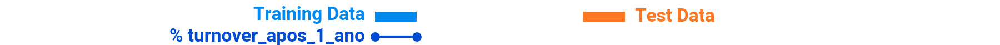

Report SWEETVIZ_REPORT.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.


In [14]:
# Comparing the train e test datasets
import sweetviz as sv
df_train_sv = df_train.copy()
df_train_sv['turnover_apos_1_ano'] = df_train_sv['turnover_apos_1_ano'].map({'SIM': 1, 'NAO': 0})
my_report = sv.compare([df_train_sv, "Training Data"], [df_test, "Test Data"], "turnover_apos_1_ano")
my_report.show_notebook()

#### Transforming the categorical data into numerical integer values according to the turnover rate

In [15]:
dict_turnover = {'SIM': 1, 
                 'NAO': 0}

df_train['turnover_apos_1_ano'] = df_train['turnover_apos_1_ano'].map(dict_turnover)


In [16]:
dict_sexo = {'FEMININO': 1, 
                 'MASCULINO': 0}

df_train['func_sexo'] = df_train['func_sexo'].map(dict_sexo)
df_test['func_sexo'] = df_test['func_sexo'].map(dict_sexo)


In [17]:
dict_racacor = {'SEM INFO': 0, 
                'PRETA-PARDA': 1, 
                'AMARELA-BRANCA':2, 
                'INDIGENA':3}

df_train['func_racacor'] = df_train['func_racacor'].map(dict_racacor)
df_test['func_racacor'] = df_test['func_racacor'].map(dict_racacor)


In [18]:
dict_escolar = {'ANALFABETO-FUND_INCOMPLETO': 1, 
                'FUND_COMPLETO-MEDIO_INCOMPLETO': 2, 
                'MEDIO COMPLETO':3, 
                'SUPERIOR_INCOMPLETO':4,
                'SUPERIOR_COMPLETO':5}

df_train['func_escolaridade'] = df_train['func_escolaridade'].map(dict_escolar)
df_test['func_escolaridade'] = df_test['func_escolaridade'].map(dict_escolar)


In [19]:
df_train.contrato_salario = df_train.contrato_salario/1000
df_test.contrato_salario = df_test.contrato_salario/1000

In [20]:
states_latlong = pd.read_csv('https://raw.githubusercontent.com/kelvins/Municipios-Brasileiros/main/csv/estados.csv')
states_latlong = states_latlong.rename(columns = {'uf': 'func_uf'})
states_latlong = states_latlong[['func_uf', 'latitude', 'longitude']]
df_states = df_train.copy()
df_states = df_states.merge(states_latlong, on = 'func_uf')

In [21]:
dict_uf = {'MA': 1,
           'AL': 2,
           'PI': 3,
           'CE': 4,
           'BA': 5,
           'RN': 6,
           'SE': 7,
           'PB': 8,
           'PE': 9
          }
           
df_train['func_uf'] = df_train['func_uf'].map(dict_uf)
df_test['func_uf'] = df_test['func_uf'].map(dict_uf)


In [22]:
dict_deficiencia = {'SIM': 1, 
                    'NAO': 0}

df_train['func_deficiencia'] = df_train['func_deficiencia'].map(dict_deficiencia)
df_test['func_deficiencia'] = df_test['func_deficiencia'].map(dict_deficiencia)


In [23]:
dict_porte = {'ATE 4': 1,
              'DE 5 A 9': 2,
              'DE 10 A 19': 3,
              'DE 20 A 49': 4,                   
              'DE 50 A 99': 5,
              'DE 100 A 249': 6,
              'DE 250 A 499': 7,
              'DE 500 A 999': 8,
              '1000 OU MAIS': 9
             }

df_train['empresa_porte'] = df_train['empresa_porte'].map(dict_porte)
df_test['empresa_porte'] = df_test['empresa_porte'].map(dict_porte)


In [24]:
dict_setor = {'Agricultura': 1,
              'Construçao civil': 2,
              'Comércio': 3,
              'Indústria': 4,
              'Serviços': 5,
              'Administraçao pública': 6
             }

df_train['empresa_setor'] = df_train['empresa_setor'].map(dict_setor)
df_test['empresa_setor'] = df_test['empresa_setor'].map(dict_setor)


In [25]:
# function to reverse the dict: turn keys to values and values to keys 
def reverse_dict(dic):
    reverse_dic = dict()
    for key in dic:
        val = dic[key]
        reverse_dic[val] = key
    return reverse_dic

# another way to do it:
# inverse_dict = {v: k for k, v in dic.items()}


In [26]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15000 entries, 0 to 14999
Data columns (total 11 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   func_sexo               15000 non-null  int64  
 1   func_idade              15000 non-null  int64  
 2   func_racacor            15000 non-null  int64  
 3   func_escolaridade       15000 non-null  int64  
 4   func_uf                 15000 non-null  int64  
 5   func_deficiencia        15000 non-null  int64  
 6   empresa_porte           15000 non-null  int64  
 7   empresa_setor           15000 non-null  int64  
 8   contrato_horastrabalho  15000 non-null  int64  
 9   contrato_salario        15000 non-null  float64
 10  turnover_apos_1_ano     15000 non-null  int64  
dtypes: float64(1), int64(10)
memory usage: 1.3 MB


In [27]:
df_train.describe()

,func_sexo,func_idade,func_racacor,func_escolaridade,func_uf,func_deficiencia,empresa_porte,empresa_setor,contrato_horastrabalho,contrato_salario,turnover_apos_1_ano
count,15000.000000,15000.000000,15000.000000,15000.000000,15000.000000,15000.000000,15000.000000,15000.000000,15000.000000,15000.000000,15000.000000
mean,0.405000,32.530133,1.007933,3.170867,5.353000,0.017600,4.619800,4.027000,40.403733,1.953761,0.360067
std,0.490908,9.719180,0.599245,1.050212,2.379349,0.131497,2.528466,1.194027,9.156334,2.528050,0.480035
min,0.000000,16.000000,0.000000,1.000000,1.000000,0.000000,1.000000,1.000000,0.000000,0.299400,0.000000
25%,0.000000,25.000000,1.000000,3.000000,4.000000,0.000000,3.000000,3.000000,44.000000,1.079228,0.000000
50%,0.000000,31.000000,1.000000,3.000000,5.000000,0.000000,4.000000,5.000000,44.000000,1.433055,0.000000
75%,1.000000,38.000000,1.000000,3.000000,7.000000,0.000000,6.000000,5.000000,44.000000,1.932750,1.000000
max,1.000000,82.000000,3.000000,5.000000,9.000000,1.000000,9.000000,6.000000,44.000000,98.641650,1.000000


## Checking for duplicates

In [339]:
df_analisando = df_train.copy()
df_analisando.drop_duplicates(keep=False, inplace=True, subset = ['func_sexo', 'func_idade', 'func_racacor', 
                                                                  'func_escolaridade','func_uf', 'func_deficiencia', 
                                                                  'empresa_porte', 'empresa_setor','contrato_horastrabalho', 
                                                                  'contrato_salario', 'turnover_apos_1_ano'])
df_analisando
# There is no duplicated line in the train dataset

,func_sexo,func_idade,func_racacor,func_escolaridade,func_uf,func_deficiencia,empresa_porte,empresa_setor,contrato_horastrabalho,contrato_salario,turnover_apos_1_ano
0,0,24,2,3,6,0,3,5,44,1.75065,1
1,0,24,0,3,5,0,1,3,44,1.00230,0
2,1,25,1,3,7,0,4,3,44,1.37014,0
3,0,54,1,3,9,0,4,3,44,1.85468,1
4,0,40,1,3,5,0,4,3,0,1.12623,0
...,...,...,...,...,...,...,...,...,...,...,...
14995,0,23,1,2,9,0,5,1,44,0.92388,0
14996,0,31,1,2,4,0,5,4,44,1.68999,0
14997,0,24,1,3,4,0,4,4,44,1.02998,0
14998,1,40,1,3,5,0,9,5,30,1.92333,1


In [341]:
df_analisando.sort_values(by = ['func_sexo', 'func_idade', 'func_racacor', 'func_escolaridade','func_uf', 'func_deficiencia', 
                                                                  'empresa_porte', 'empresa_setor','contrato_horastrabalho', 
                                                                  'contrato_salario', 'turnover_apos_1_ano']).head(50)

,func_sexo,func_idade,func_racacor,func_escolaridade,func_uf,func_deficiencia,empresa_porte,empresa_setor,contrato_horastrabalho,contrato_salario,turnover_apos_1_ano
10338,0,16,1,2,5,0,1,3,36,0.64853,0
14148,0,17,0,2,5,0,6,3,20,0.48163,0
14839,0,17,0,3,7,0,4,5,44,0.99800,0
12233,0,17,0,3,8,0,3,3,32,1.05011,0
5289,0,17,1,1,5,0,1,5,44,1.00915,0
7722,0,18,0,2,5,0,2,3,44,1.42206,0
9077,0,18,0,2,5,0,6,1,44,1.05729,0
10012,0,18,0,3,5,0,4,5,44,0.99805,0
11775,0,18,0,3,5,0,9,5,44,1.03045,0
12956,0,18,0,3,9,0,3,2,44,1.24521,0


In [28]:
df_train.columns

Index(['func_sexo', 'func_idade', 'func_racacor', 'func_escolaridade',
       'func_uf', 'func_deficiencia', 'empresa_porte', 'empresa_setor',
       'contrato_horastrabalho', 'contrato_salario', 'turnover_apos_1_ano'],
      dtype='object')

In [29]:
df = df_train.drop(columns = ['turnover_apos_1_ano'], axis = 1)
df = pd.concat([df, df_test])
df_analisando = df.copy()
df_analisando.drop_duplicates(keep=False, inplace=True)
df_analisando.sort_values(by = ['func_sexo', 'func_idade', 'func_racacor', 'func_escolaridade','func_uf', 'func_deficiencia', 
                                                                  'empresa_porte', 'empresa_setor','contrato_horastrabalho', 
                                                                  'contrato_salario']).head(50)

,func_sexo,func_idade,func_racacor,func_escolaridade,func_uf,func_deficiencia,empresa_porte,empresa_setor,contrato_horastrabalho,contrato_salario
14501,0,16,1,1,5,0,4,1,44,0.99799
10338,0,16,1,2,5,0,1,3,36,0.64853
14972,0,17,0,2,5,0,4,3,44,1.03799
14148,0,17,0,2,5,0,6,3,20,0.48163
8915,0,17,0,3,6,0,3,5,30,0.50550
14839,0,17,0,3,7,0,4,5,44,0.99800
12233,0,17,0,3,8,0,3,3,32,1.05011
5289,0,17,1,1,5,0,1,5,44,1.00915
11214,0,17,1,3,5,0,1,3,22,0.48477
13939,0,18,0,2,3,0,1,3,44,1.04125


* From the analysis above, it was not observed duplicated data

### Testing the data with no transfomation

***

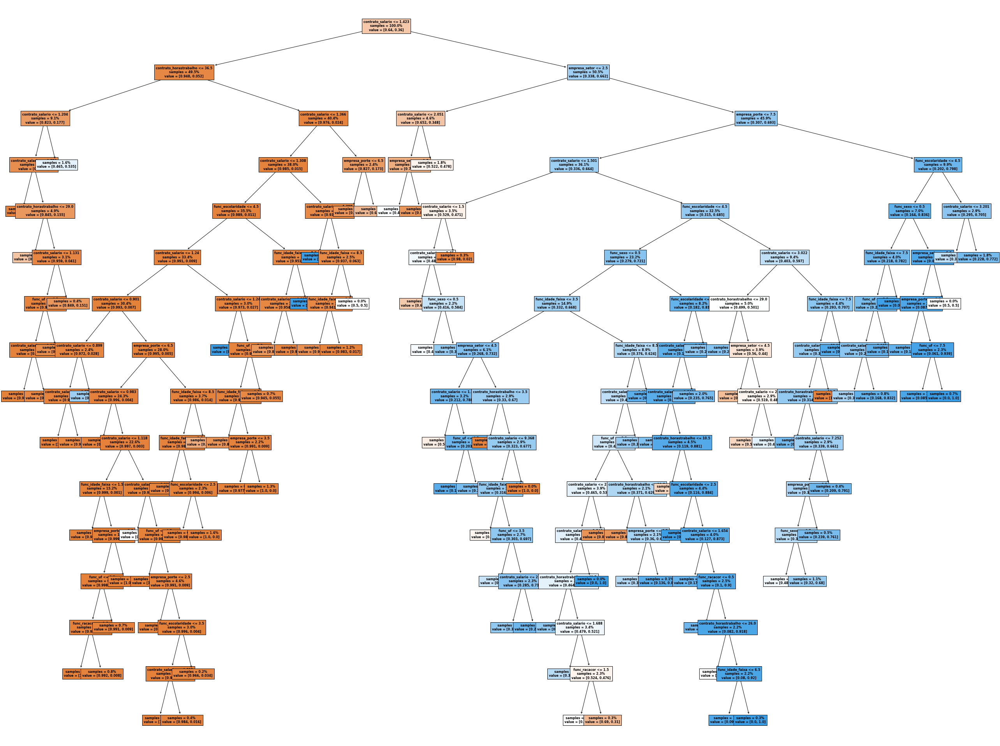

In [30]:
# Looking for a pattern using Decision Tree
SEED = 1
np.random.seed(SEED)


model = DecisionTreeClassifier(min_samples_split = 300)

model.fit(X, y)

plt.figure(figsize = (45, 35))
plot_tree(model, filled=True, proportion = True, impurity = False, fontsize=8, feature_names = X.columns)
#plt.savefig('tree_high_dpi', dpi=100)
plt.show()

## Sweetviz EDA

                                             |                                             | [  0%]   00:00 ->…


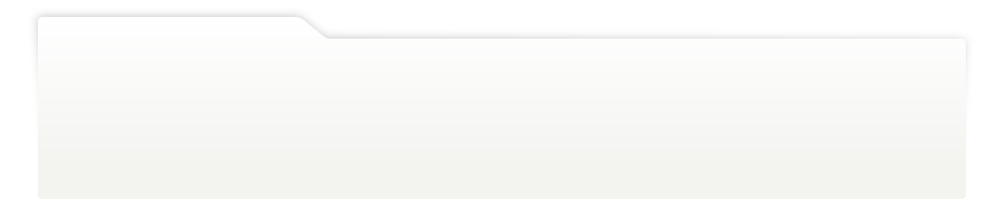
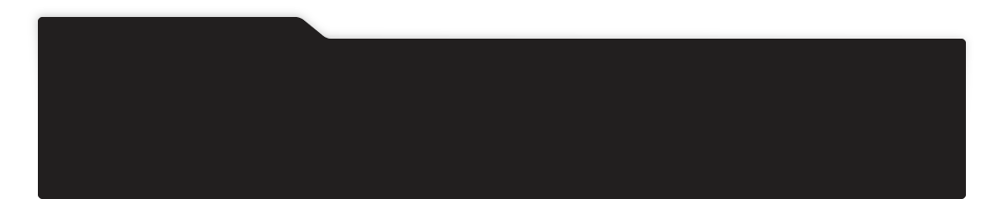
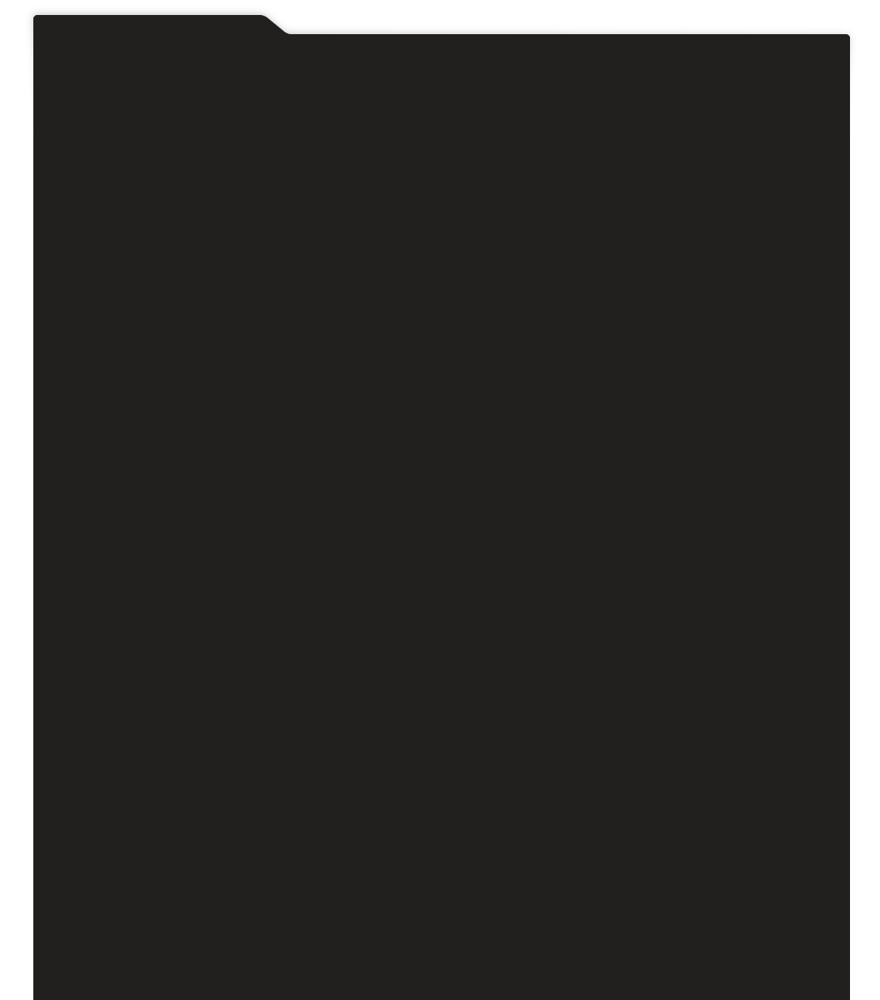
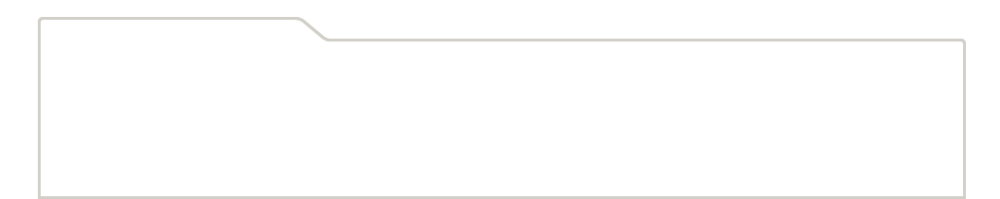
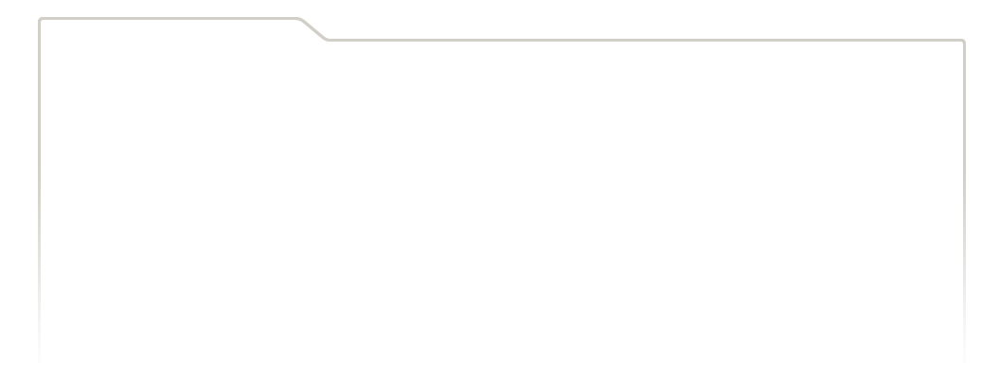
...
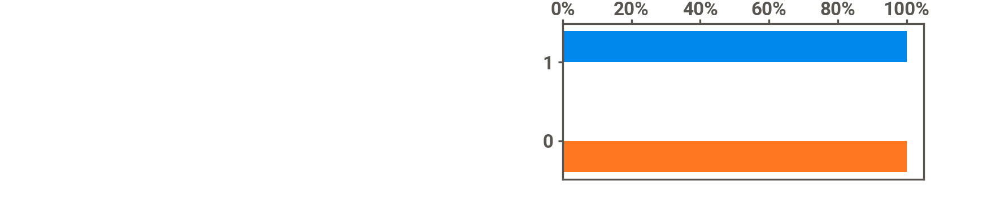
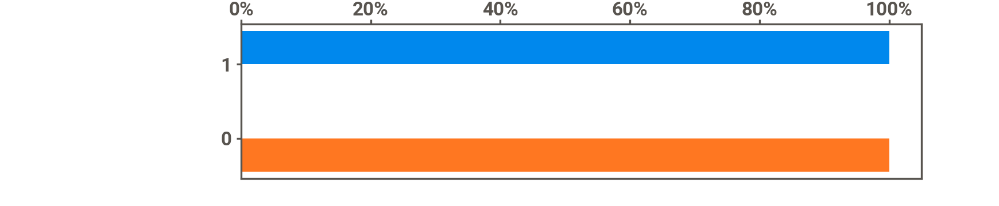
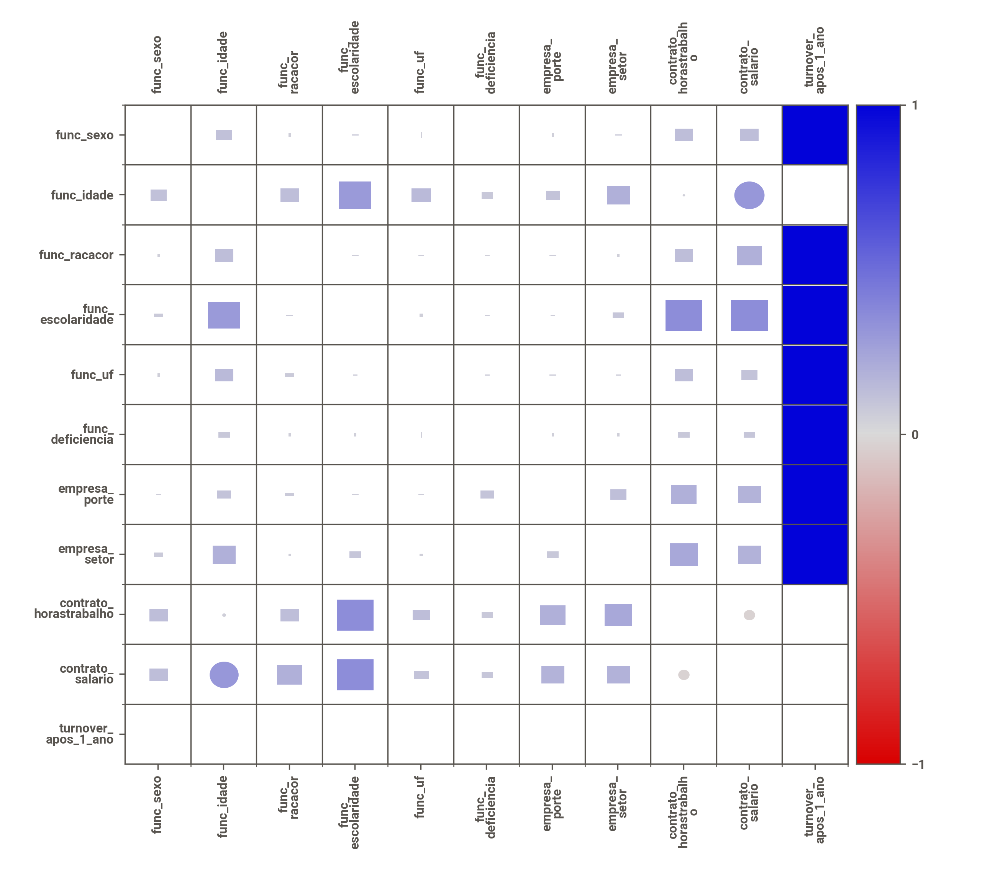
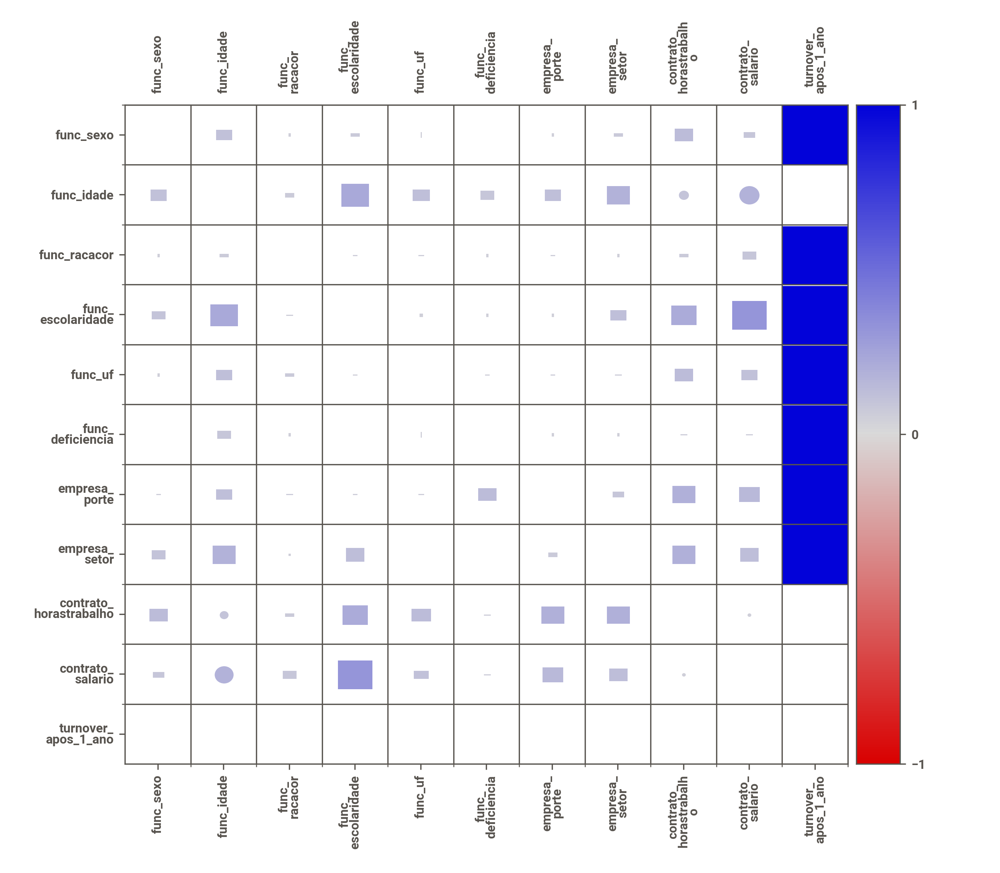
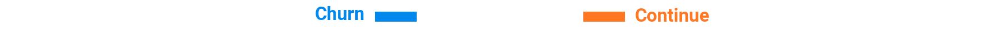

Report SWEETVIZ_REPORT_ChurnXnaoChurn.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.


In [30]:
my_report = sv.compare([df_train[df_train.turnover_apos_1_ano==1], "Churn"], [df_train[df_train.turnover_apos_1_ano==0], "Continue"])
my_report.show_notebook()


### Sweetviz analysis Churn Vs Continued:
- women tends to leave the company more often than men;
- 

<AxesSubplot:>

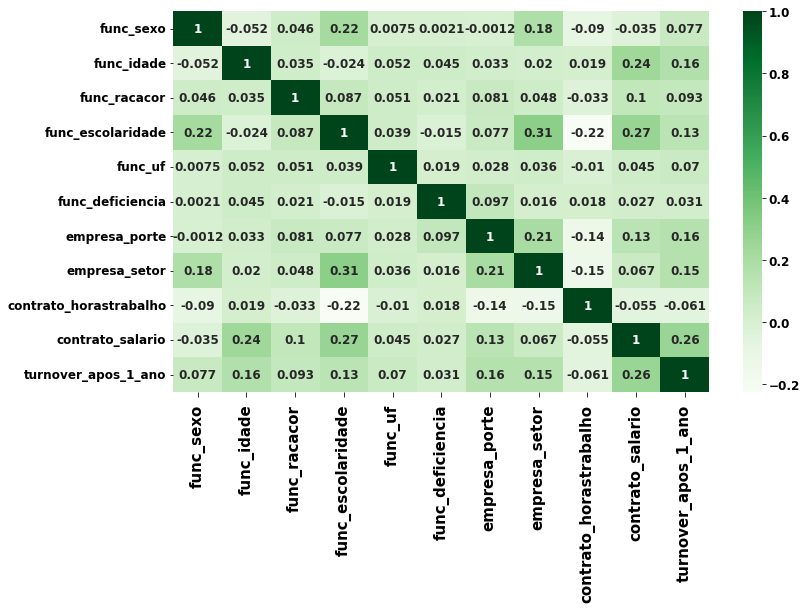

In [146]:
plt.figure(figsize=(12, 7))
sns.heatmap(df_train.corr(), annot=True, cmap='Greens')

* It is noted a low pearson correlation between the variables

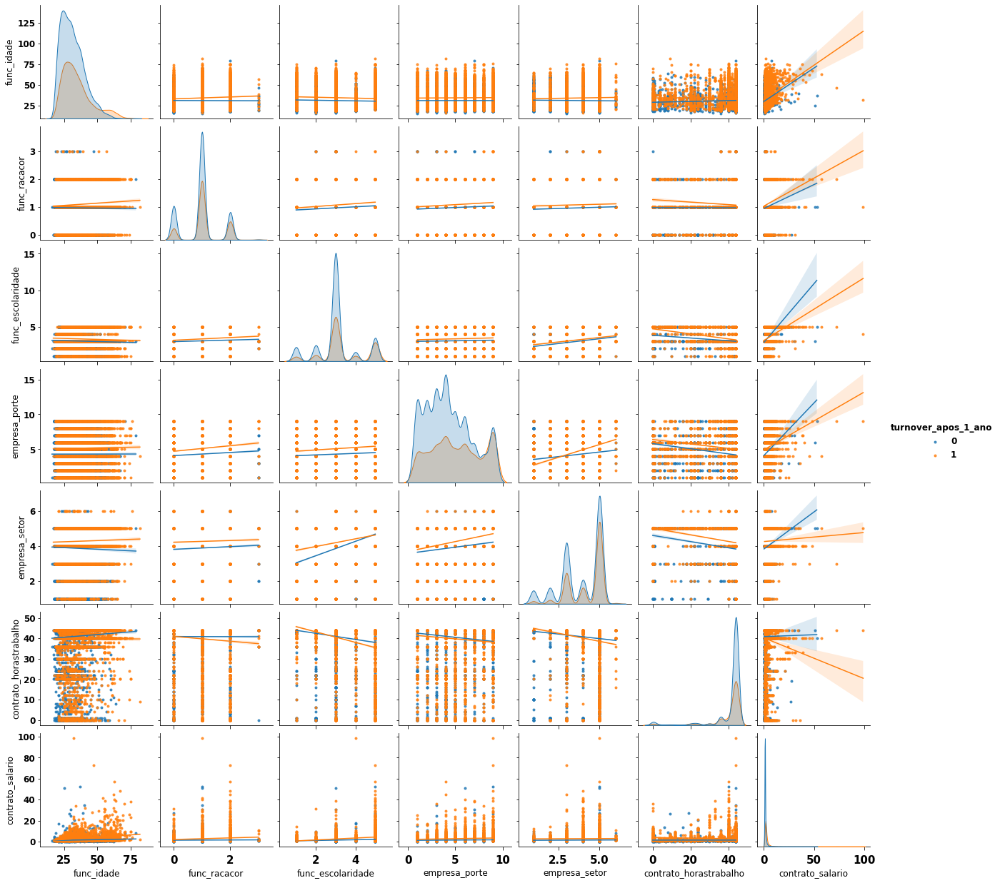

In [147]:
sns.pairplot(df_train.drop(columns=['func_sexo', 'func_deficiencia', 'func_uf'], axis=1),
             kind = 'reg',
             hue = 'turnover_apos_1_ano',
             markers = '.',)

* From the pairplot above, it can be seen a distint distribution of the variables comparing the Churn and No Churn data, especially when looking at the age (func_idade) and company size (empresa_porte) plots. 

## <font color=green>Evaluating the features</font>
***
- First the numerical ones
- Then the ordinal
- Finally, the categorical variables

In [32]:
from matplotlib.gridspec import GridSpec

def distribution_plot(column, title, color='deepskyblue'): # from: https://www.kaggle.com/code/galaxygeorge/customer-churn-modeling-eda-fe-model#EDA-+-FE:-Exploratory-Data-Analysis-and-Feature-Engineering

    fig = plt.figure(figsize=(17, 7))
    grid = GridSpec(nrows=2, ncols=1, figure=fig)

    ax0 = fig.add_subplot(grid[0, :])
    ax0.set_title(f'Histogram and BoxPlot of {title}')
    sns.histplot(column, ax=ax0, kde=True, 
                 stat="density", color=color, 
                )

    ax1 = fig.add_subplot(grid[1, :])
    plt.axis('off')
    sns.boxplot(x=column, ax=ax1, color=color, 
               )
    print(f'Skewness for {title} =======>>> {column.skew():.3f}')

## 1º Numerical Features

## <font color=blue> 1. EDA - contrato_salario

### 1.1 Distribution

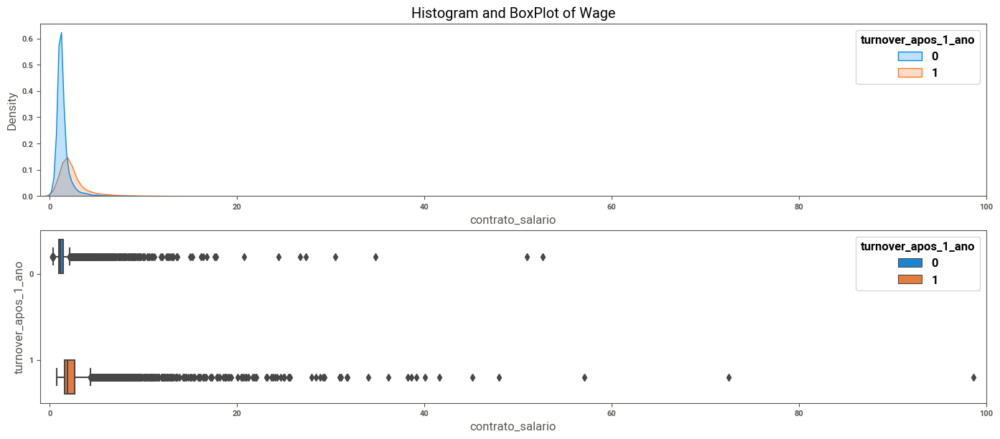

In [64]:

fig = plt.figure(figsize=(17, 7))
grid = GridSpec(nrows=2, ncols=1, figure=fig)

ax0 = fig.add_subplot(grid[0, :])
ax0.set_title('Histogram and BoxPlot of Wage')
sns.kdeplot(data=df_train, x="contrato_salario", hue="turnover_apos_1_ano", multiple="layer", 
           fill=True, ax=ax0
           )
ax0.set_xlim(left=-1, right=100)
ax1 = fig.add_subplot(grid[1, :])
#plt.axis('off')
sns.boxplot(data=df_train, x = df_train.contrato_salario, y = 'turnover_apos_1_ano', 
                 hue = 'turnover_apos_1_ano', 
            orient="h",ax=ax1)
ax1.set_xlim(left=-1, right=100)
plt.show()

* Looking at the distribution of the feature wage, there is a difference between churn and non-churn data. Non-churn data tend to be exponentially distributed while Churn data appear to be more normally distributed. It can be proven by their Skewness.
* It can also be highlighted that there is a difference in their medians

Skewness for Wage =======>>> 12.339
Skewness for Wage - No Churn =======>>> 14.971
Skewness for Wage - Churn =======>>> 9.698


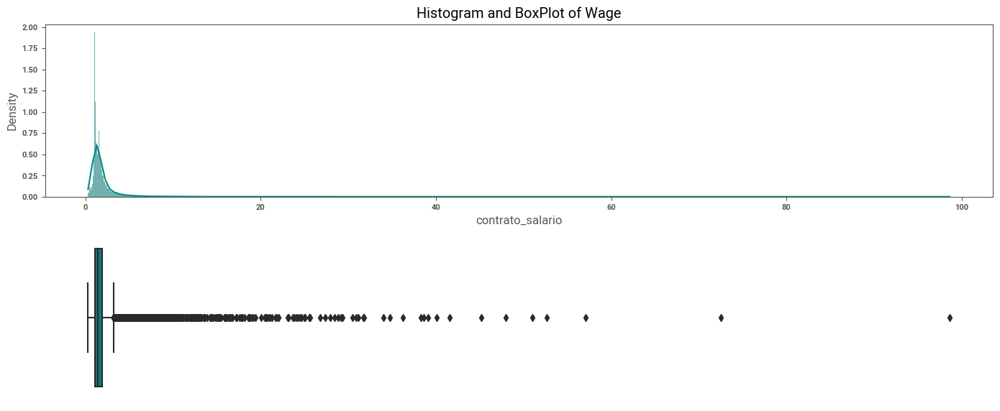

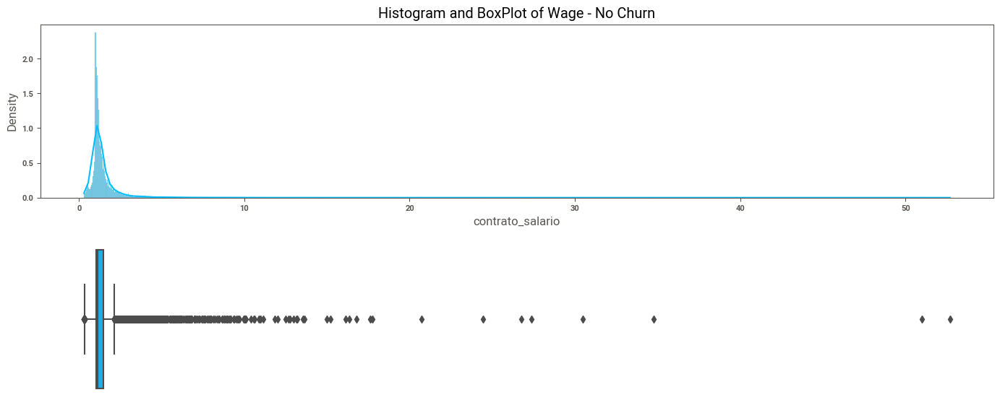

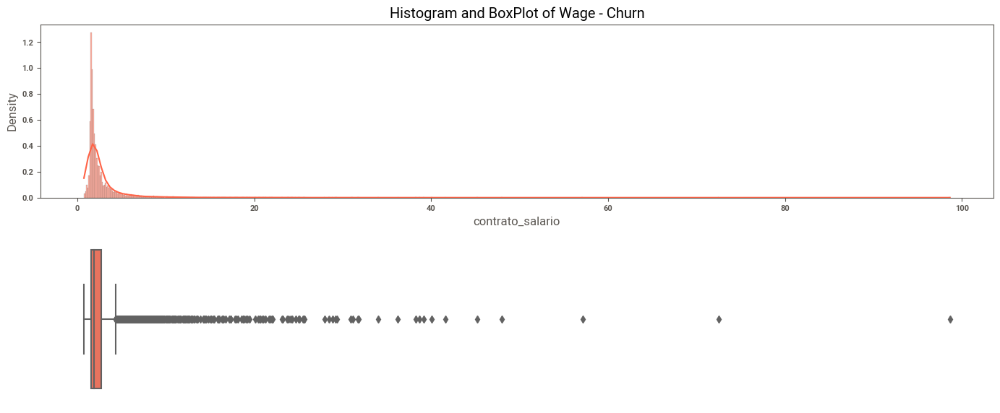

In [65]:
distribution_plot(df_train.contrato_salario, 'Wage', color='darkcyan')
distribution_plot(df_train.loc[df_train.turnover_apos_1_ano==0].contrato_salario, 'Wage - No Churn')
distribution_plot(df_train.loc[df_train.turnover_apos_1_ano==1].contrato_salario, 'Wage - Churn', color='tomato')

(-1.0, 100.0)

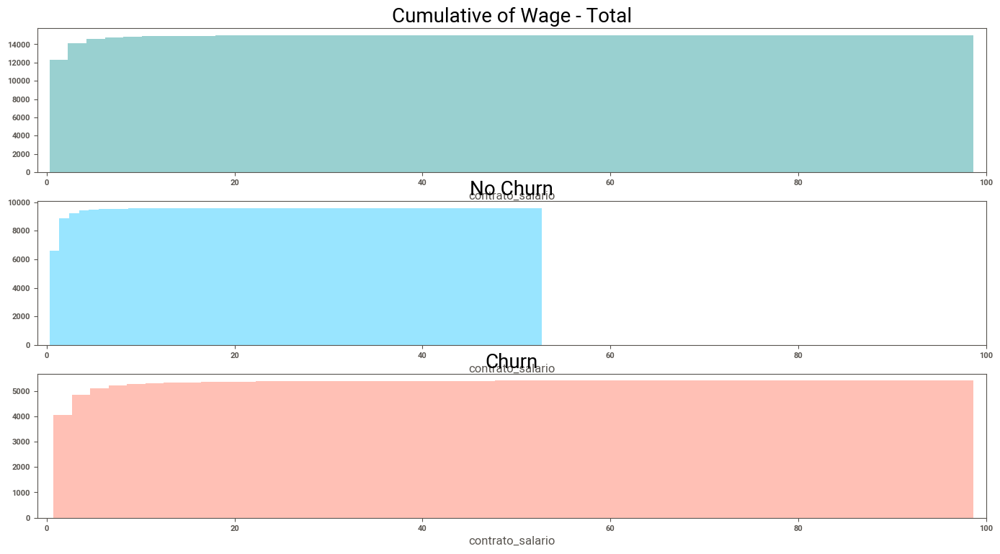

In [76]:
fig = plt.figure(figsize=(17, 9))
grid = GridSpec(nrows=3, ncols=1, figure=fig)

ax0 = fig.add_subplot(grid[0, :])
ax0.set_title(f'Cumulative of Wage - Total', fontsize=20)
#plt.axis('off')
sns.distplot(df_train.contrato_salario, 
                  hist_kws = {'cumulative':True}, 
             kde=False,
                  #kde_kws = {'cumulative':True},
                  color='darkcyan')
ax0.set_xlim(left=-1, right=100)

ax1 = fig.add_subplot(grid[1, :])

sns.distplot(df_train.loc[df_train.turnover_apos_1_ano==0].contrato_salario, 
                  hist_kws = {'cumulative':True}, 
             kde=False,
                  #kde_kws = {'cumulative':True},
                  color='deepskyblue'
            ) \
                 .set_title(f'No Churn', fontsize=20)
    
ax1.set_xlim(left=-1, right=100)

ax2 = fig.add_subplot(grid[2, :])

sns.distplot(df_train.loc[df_train.turnover_apos_1_ano==1].contrato_salario, 
                  hist_kws = {'cumulative':True}, 
             kde=False,
                  #kde_kws = {'cumulative':True}, 
                  color='tomato'
            ) \
                 .set_title(f'Churn', fontsize=20)

ax2.set_xlim(left=-1, right=100)  


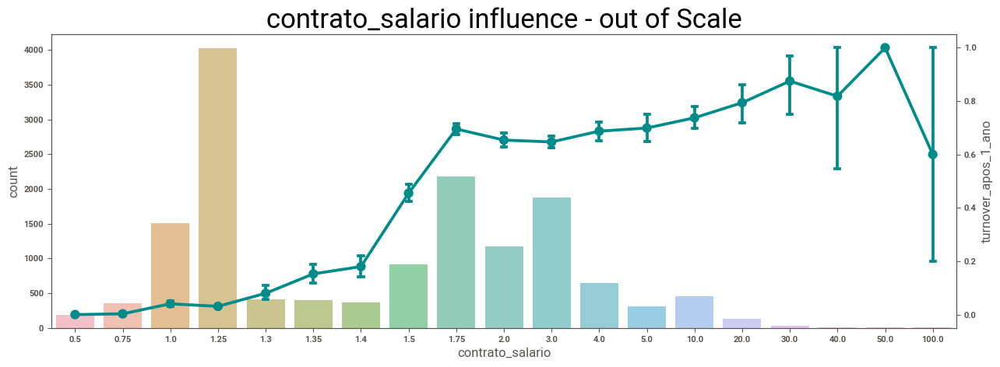

In [77]:
def wage_plot(data, color = 'darkcyan', hue = None): 
    
    col_name = 'contrato_salario'
    wage_data = data[[col_name, 'turnover_apos_1_ano']]
    wage_data[col_name] = pd.cut(wage_data[col_name],
                               bins=[0, 0.5, 0.75, 1, 1.25,1.3,1.35, 1.4, 1.5,1.75, 2, 3, 4, 5,  10, 20, 30, 40 , 50, 100],
                               labels=[0.5, 0.75, 1, 1.25, 1.3,1.35,1.4, 1.5, 1.75, 2, 3, 4,  5, 10, 20, 30, 40 , 50, 100])

    ax1 = sns.set_style(style=None, rc=None)

    fig, ax1 = plt.subplots(figsize=(15,5))

    sns.countplot(x=col_name, data=wage_data, ax=ax1, alpha=0.6)     \
                 .set_title(f'{col_name} influence - out of Scale', fontsize=25)
    
    ax2 = ax1.twinx()
    
    sns.pointplot(x=col_name, y='turnover_apos_1_ano',
                  dodge=0.1, capsize=.1, data=wage_data, color=color, hue=hue, row=hue, ax=ax2)

    
wage_plot(df_train)


#### OBS
* From this graph, some patterns can be observed.
 - There is a similarity when wage is below 1.25K
 - There is a higher variance when wage is above 30K
 - when the wage is between 1.75K and 20K there is a similarity in the churn rate

### 1.2. ANOVA to compare groups of wages

In [78]:
# ANOVA to compare the group of people that receive a wage higher than 20K and when it´s bigger than 30K
df_anova = pd.DataFrame(stats.f_oneway(df_train.loc[df_train.contrato_salario >30],
              df_train.loc[df_train.contrato_salario > 20])[1],
             index = df_train.columns,
                       columns = ['p_value'])

def func_anova(x):
    if x >= 0.05:
        return '='
    else:
        return 'distinct'


df_anova['ANOVA'] = df_anova['p_value'].map(func_anova)
df_anova

,p_value,ANOVA
func_sexo,0.353537,=
func_idade,0.634753,=
func_racacor,0.514150,=
func_escolaridade,0.260213,=
func_uf,0.668505,=
func_deficiencia,0.900204,=
empresa_porte,0.896820,=
empresa_setor,0.360352,=
contrato_horastrabalho,0.689994,=
contrato_salario,0.002504,distinct


* Based on the ANOVA test above, it can be concluded that there are no evidences that there is a difference. Therefore, it can established a maximum wage of 20K.

In [79]:
# ANOVA to compare the group of people that receive a wage higher than 20K and when it´s bigger than 30K
df_anova = pd.DataFrame(stats.f_oneway(df_train.loc[df_train.contrato_salario > 20],
              df_train.loc[df_train.contrato_salario >= 15])[1],
             index = df_train.columns,
                       columns = ['p_value'])

def func_anova(x):
    if x >= 0.05:
        return '='
    else:
        return 'distinct'


df_anova['ANOVA'] = df_anova['p_value'].map(func_anova)
df_anova

,p_value,ANOVA
func_sexo,0.337528,=
func_idade,0.430491,=
func_racacor,0.889152,=
func_escolaridade,0.748993,=
func_uf,0.630310,=
func_deficiencia,0.761955,=
empresa_porte,0.318592,=
empresa_setor,0.828950,=
contrato_horastrabalho,0.317215,=
contrato_salario,0.013708,distinct


* Based on the ANOVA test above, it can be concluded that there are no evidences that there is a difference. Therefore, it can established a maximum wage of 15K.

In [80]:
# ANOVA to compare the group of people that receive a wage smaller than 0.5K and when it´s lower than 0.75K
df_anova = pd.DataFrame(stats.f_oneway(df_train.loc[df_train.contrato_salario <= 0.5],
              df_train.loc[df_train.contrato_salario <= 0.75])[1],
             index = df_train.columns,
                       columns = ['p_value'])

def func_anova(x):
    if x >= 0.05:
        return '='
    else:
        return 'distinct'


df_anova['ANOVA'] = df_anova['p_value'].map(func_anova)
df_anova

,p_value,ANOVA
func_sexo,6.336255e-01,=
func_idade,2.430052e-01,=
func_racacor,8.640675e-01,=
func_escolaridade,5.951802e-01,=
func_uf,6.999099e-01,=
func_deficiencia,2.366352e-01,=
empresa_porte,4.526602e-01,=
empresa_setor,8.299659e-01,=
contrato_horastrabalho,2.901475e-02,distinct
contrato_salario,1.127580e-41,distinct


* Analyzing the ANOVA, it can be seen that the only difference in the test is shown in the working hours feature

In [81]:
# ANOVA when wage is lower than 1.25K : Comparing the Churn and No Churn
df_anova = df_train.loc[df_train.contrato_salario <= 1.25]
df_anova = pd.DataFrame(stats.f_oneway(df_anova.loc[df_train.turnover_apos_1_ano == 0],
              df_anova.loc[df_anova.turnover_apos_1_ano == 1])[1],
             index = df_train.columns,
                       columns = ['p_value'])

def func_anova(x):
    if x >= 0.05:
        return '='
    else:
        return 'distinct'


df_anova['ANOVA'] = df_anova['p_value'].map(func_anova)
df_anova

,p_value,ANOVA
func_sexo,6.112978e-04,distinct
func_idade,2.808188e-01,=
func_racacor,1.665415e-01,=
func_escolaridade,2.053335e-24,distinct
func_uf,3.443956e-03,distinct
func_deficiencia,8.140732e-01,=
empresa_porte,5.393956e-03,distinct
empresa_setor,2.315541e-11,distinct
contrato_horastrabalho,6.300464e-97,distinct
contrato_salario,1.080021e-02,distinct


In [134]:
df_train.loc[(df_train.contrato_salario<=1.25) & (df_train.turnover_apos_1_ano ==1)].empresa_setor.value_counts(normalize=True)

5    0.758065
3    0.145161
4    0.053763
1    0.032258
2    0.010753
Name: empresa_setor, dtype: float64

In [130]:
df_train.loc[(df_train.contrato_salario<=1.25) & (df_train.turnover_apos_1_ano ==1)].func_racacor.value_counts(normalize=True)

1    0.688172
2    0.161290
0    0.150538
Name: func_racacor, dtype: float64

#### OBS
- It can be noted that when wage is lower than 1.25K and the person churned, the majority of people works in the company sector 5 (Serviços), and has a race of 1. Also, work hours per week (contrato_horastrabalho) are smaller in that group

### 1.3. Analyzing the LOG of wage

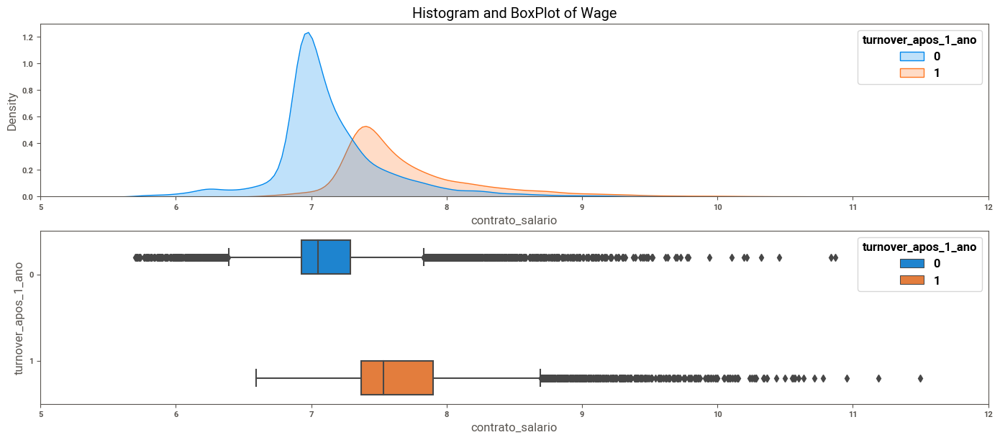

In [85]:
fig = plt.figure(figsize=(17, 7))
grid = GridSpec(nrows=2, ncols=1, figure=fig)

ax0 = fig.add_subplot(grid[0, :])
ax0.set_title('Histogram and BoxPlot of Wage')
sns.kdeplot(data=df_train, x=np.log(df_train.contrato_salario * 1000), hue="turnover_apos_1_ano", multiple="layer", 
           fill=True, ax=ax0
           )
ax0.set_xlim(left=5, right=12)
ax1 = fig.add_subplot(grid[1, :])
#plt.axis('off')
sns.boxplot(data=df_train, x = np.log(df_train.contrato_salario * 1000), y = 'turnover_apos_1_ano', 
                 hue = 'turnover_apos_1_ano', 
            orient="h",ax=ax1)
ax1.set_xlim(left=5, right=12)
plt.show()

Skewness for Log Wage =======>>> 2.416
Skewness for Log Wage - No Churn =======>>> 2.843
Skewness for Log Wage - Churn =======>>> 2.390


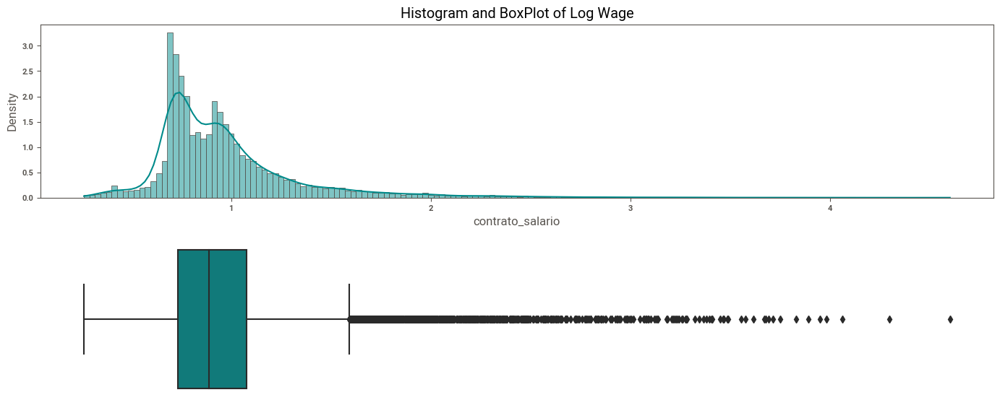

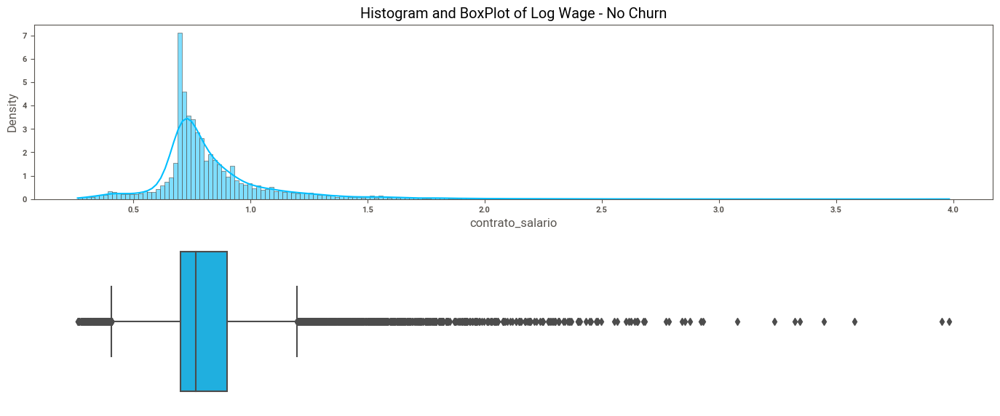

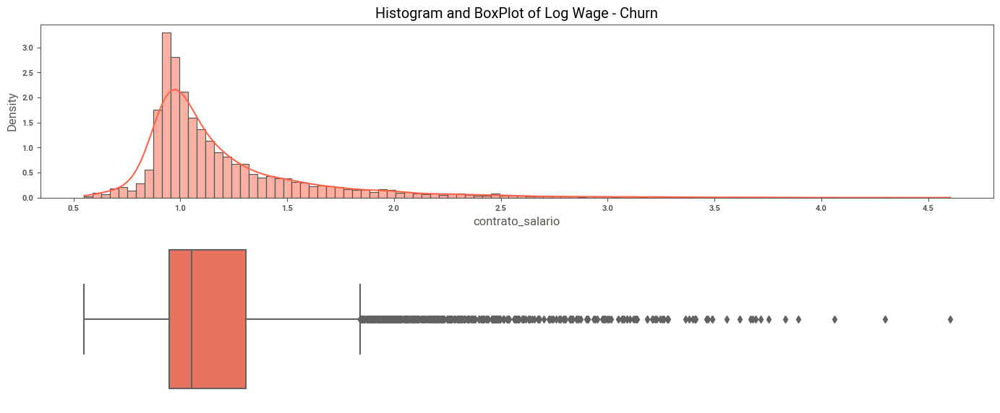

In [86]:
distribution_plot(np.log1p(df_train.contrato_salario), 'Log Wage', color='darkcyan')
distribution_plot(np.log1p(df_train.loc[df_train.turnover_apos_1_ano==0].contrato_salario), 'Log Wage - No Churn')
distribution_plot(np.log1p(df_train.loc[df_train.turnover_apos_1_ano==1].contrato_salario), 'Log Wage - Churn', color='tomato')

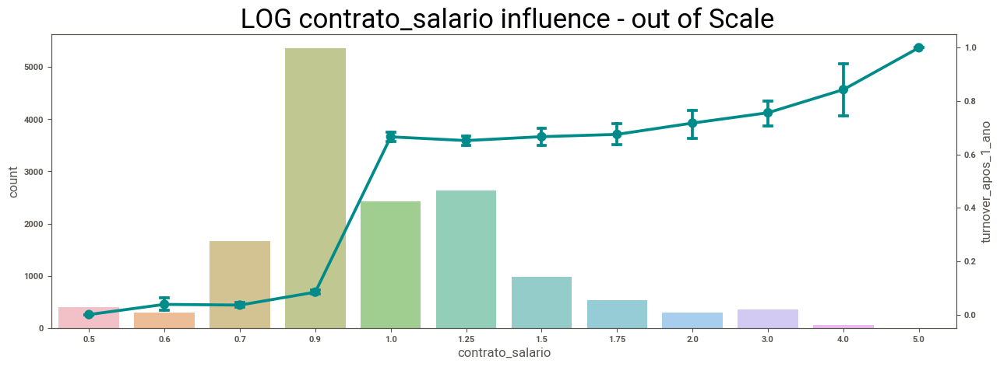

In [87]:
def log_wage_plot(data, color = 'darkcyan', hue = None):  # from: https://www.kaggle.com/code/galaxygeorge/customer-churn-modeling-eda-fe-model#EDA-+-FE:-Exploratory-Data-Analysis-and-Feature-Engineering
    
    col_name = 'contrato_salario'
    wage_data = data[[col_name, 'turnover_apos_1_ano']]
    wage_data[col_name] = np.log1p(wage_data[col_name])
    wage_data[col_name] = pd.cut(wage_data[col_name],
                               bins=[0, 0.5, 0.6, 0.7, 0.9, 1, 1.25, 1.5,1.75, 2, 3, 4, 5],
                               labels=[0.5, 0.6, 0.7, 0.9, 1, 1.25, 1.5, 1.75, 2, 3, 4,  5])
    
    ax1 = sns.set_style(style=None, rc=None)

    fig, ax1 = plt.subplots(figsize=(15,5))

    sns.countplot(x=col_name, data=wage_data, ax=ax1, alpha=0.6)     \
                 .set_title(f' LOG {col_name} influence - out of Scale', fontsize=25)
    
    ax2 = ax1.twinx()
    
    sns.pointplot(x=col_name, y='turnover_apos_1_ano',
                  dodge=0.1, capsize=.1, data=wage_data, color=color, hue=hue, row=hue, ax=ax2)

    

    
log_wage_plot(df_train)

#### OBS
- It can be observed that at the same time as the turnover rate increases with the wage, the variation also gets higher

### 1.4 Comparing Wage and other features

### 1.4.1. Deficiency x Wage
* It can be observed that wahen the person has a deficiency, the churn rate is higher in almost every group of wage


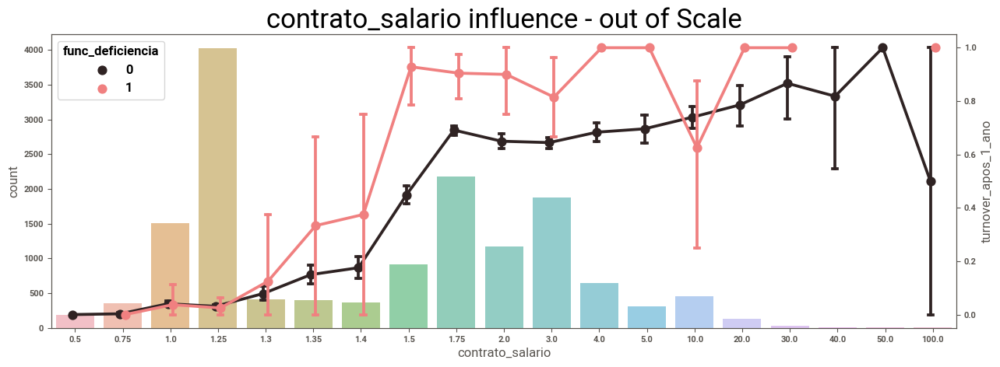

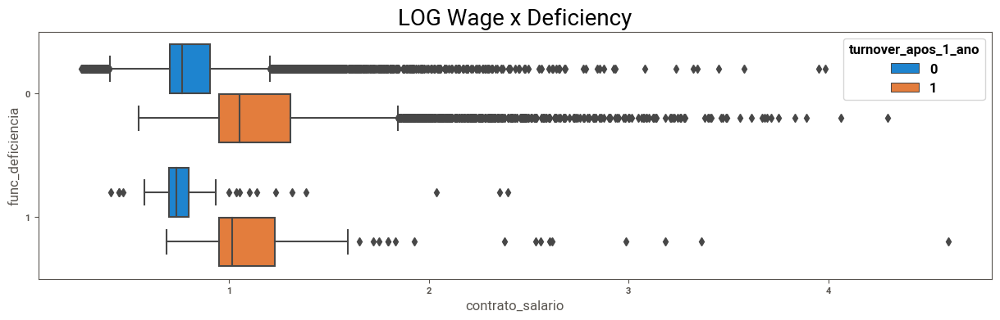

In [88]:
wage_plot(df_train, color = 'lightcoral',hue=df_train.func_deficiencia)
plt.figure(figsize=(15, 4))
ax = sns.boxplot(data=df_train, x = np.log1p(df_train.contrato_salario) , y = 'func_deficiencia', 
                 hue = 'turnover_apos_1_ano', orient="h",).set_title('LOG Wage x Deficiency', fontsize = 20)

* There seems to be a difference on churn rate when the person has a deficiency. However, since there is not much data on people with deficiency, we cannot draw a conclusion about it.

### 1.4.2. Sex x Wage

<Figure size 1500x400 with 0 Axes>

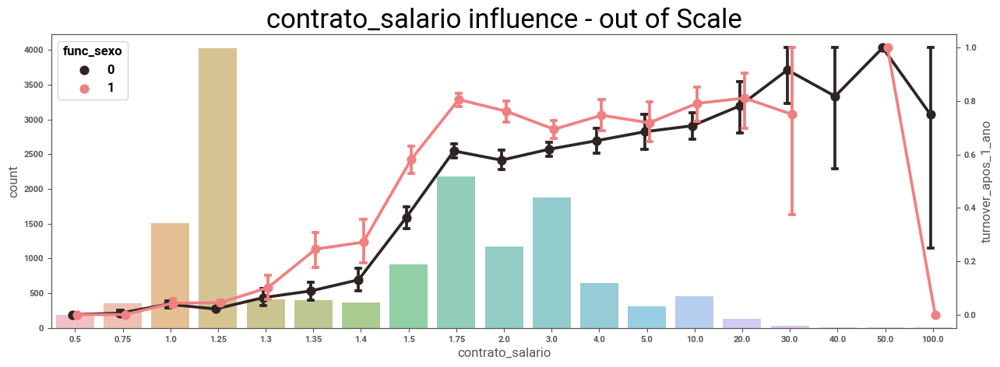

<Figure size 1500x400 with 0 Axes>

In [89]:
wage_plot(df_train, color = 'lightcoral',hue=df_train.func_sexo)



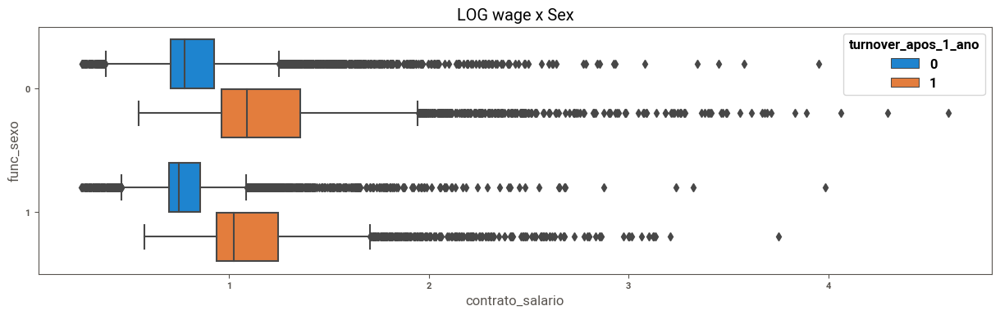

In [91]:
plt.figure(figsize=(15, 4))
ax = sns.boxplot(data=df_train, x = np.log1p(df_train.contrato_salario) , 
                 y = 'func_sexo', hue = 'turnover_apos_1_ano', orient="h",).set_title('LOG wage x Sex')

#### OBS
- Women (func_sexo = 1) have a higher chance to churn in almost all cuts

### 1.4.3. Race x Wage

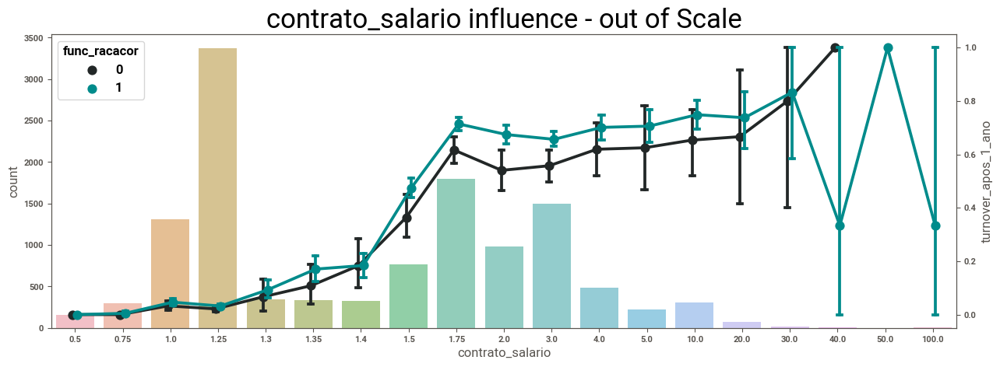

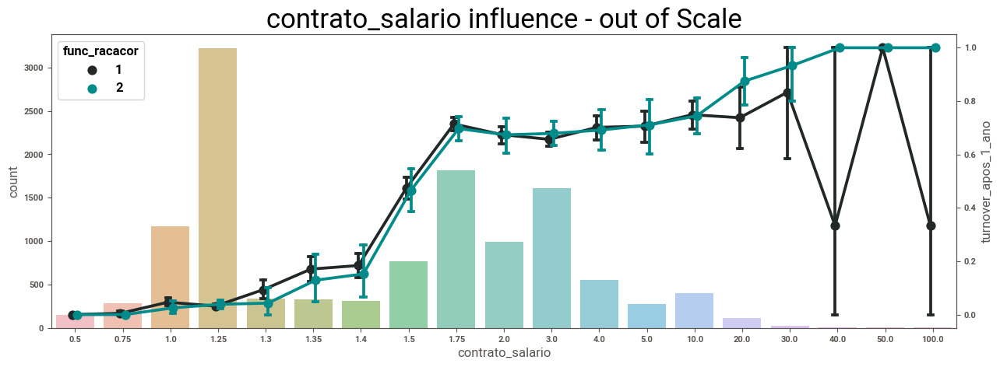

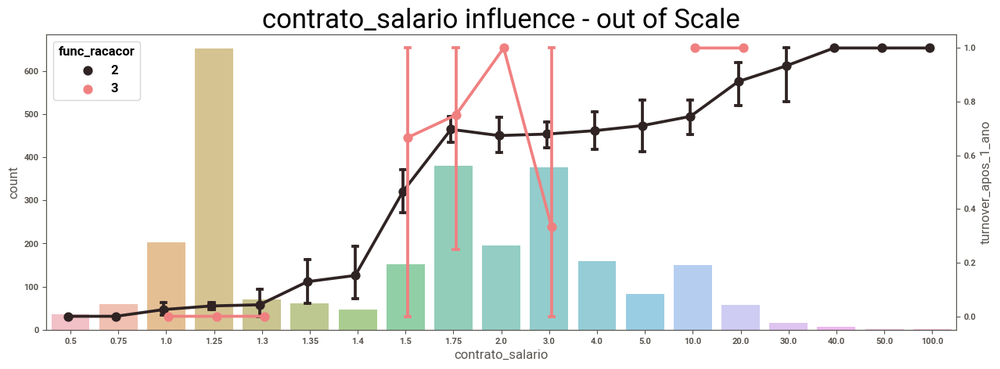

In [93]:
#wage_plot(df_train, hue=df_train.func_racacor)
wage_plot(df_train.loc[df_train.func_racacor<2], hue=df_train.loc[df_train.func_racacor<2].func_racacor)
wage_plot(df_train.loc[(df_train.func_racacor==1) | (df_train.func_racacor==2)], hue=df_train.loc[(df_train.func_racacor==1) | (df_train.func_racacor==2)].func_racacor)
wage_plot(df_train.loc[df_train.func_racacor>=2], color = 'lightcoral',hue=df_train.loc[df_train.func_racacor>=2].func_racacor)


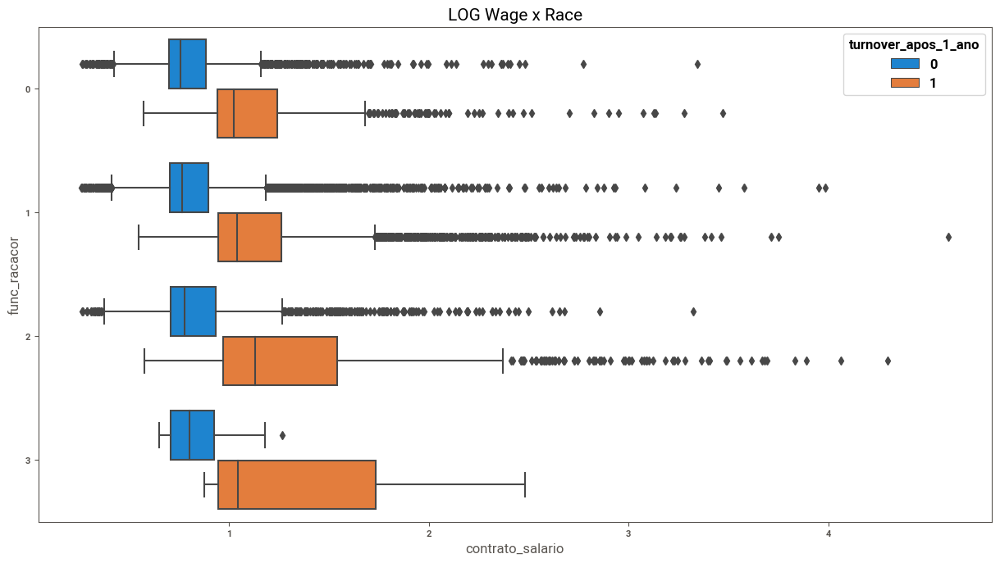

In [94]:
plt.figure(figsize=(15, 8))
ax = sns.boxplot(data=df_train, x = np.log1p(df_train.contrato_salario) , y = 'func_racacor', hue = 'turnover_apos_1_ano', orient="h",)\
                 .set_title(f'LOG Wage x Race', fontsize=15)

#### OBS
- Races 1,2 and 3 have a similar behaviour when contrato_salario is below 1.25K
- There is a similarity when there is no churn in the groups 0, 1 (and 2)
- On the other hand, when there is a churn, the similar groups are 0 and 1 (and the median of 3)
- An ANOVA test will be performed later to compare these groups

### 1.4.4. Education x Wage

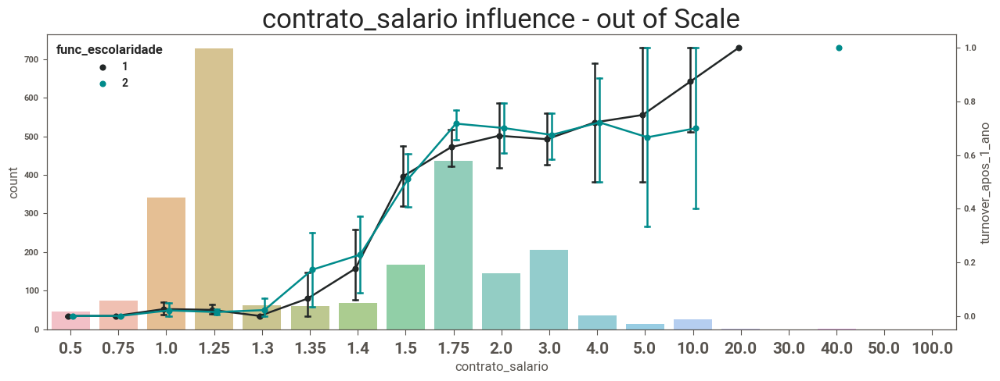

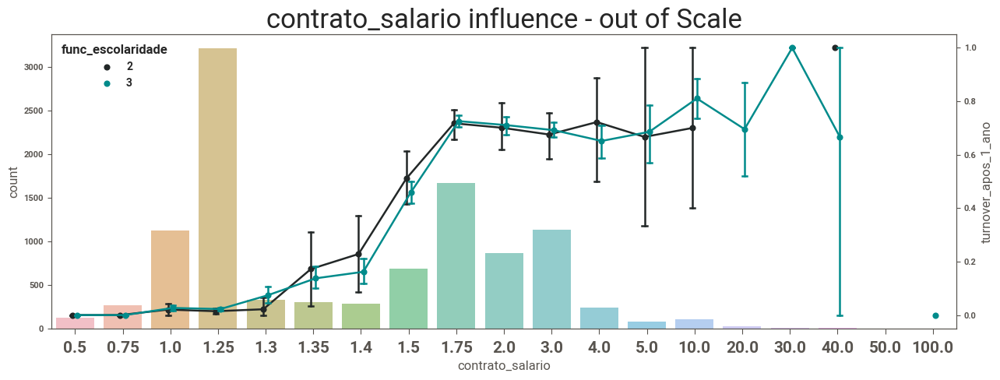

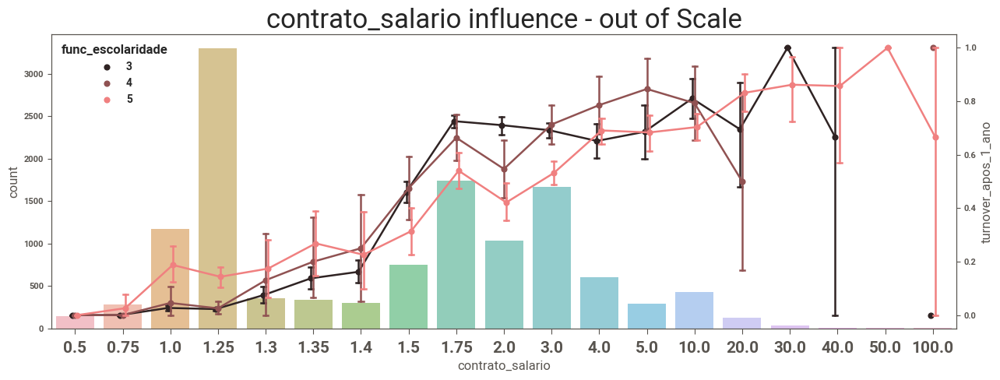

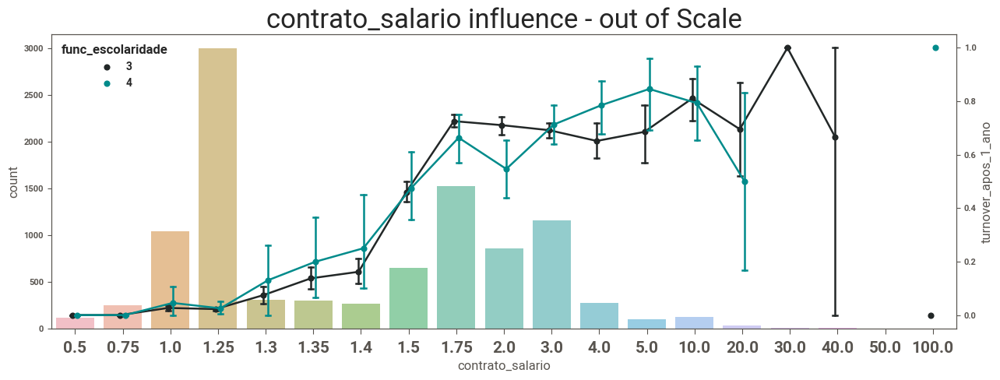

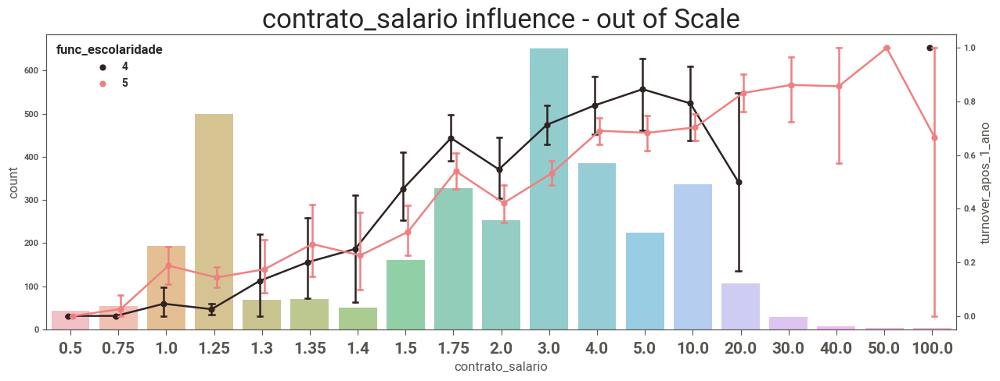

In [230]:
wage_plot(df_train.loc[df_train.func_escolaridade<3], hue=df_train.loc[df_train.func_escolaridade<3].func_escolaridade)
wage_plot(df_train.loc[(df_train.func_escolaridade==3) | (df_train.func_escolaridade==2)], hue=df_train.loc[(df_train.func_escolaridade==3) | (df_train.func_escolaridade==2)].func_escolaridade)
wage_plot(df_train.loc[df_train.func_escolaridade>=3], color = 'lightcoral',hue=df_train.loc[df_train.func_escolaridade>=3].func_escolaridade)
wage_plot(df_train.loc[(df_train.func_escolaridade==3) | (df_train.func_escolaridade==4)], hue=df_train.loc[(df_train.func_escolaridade==3) | (df_train.func_escolaridade==4)].func_escolaridade)
wage_plot(df_train.loc[df_train.func_escolaridade>=4], color = 'lightcoral',hue=df_train.loc[df_train.func_escolaridade>=4].func_escolaridade)


#### OBS
* When wage is lower than 1.25K, all the education levels has a similar behaviour with a exception for the level 5

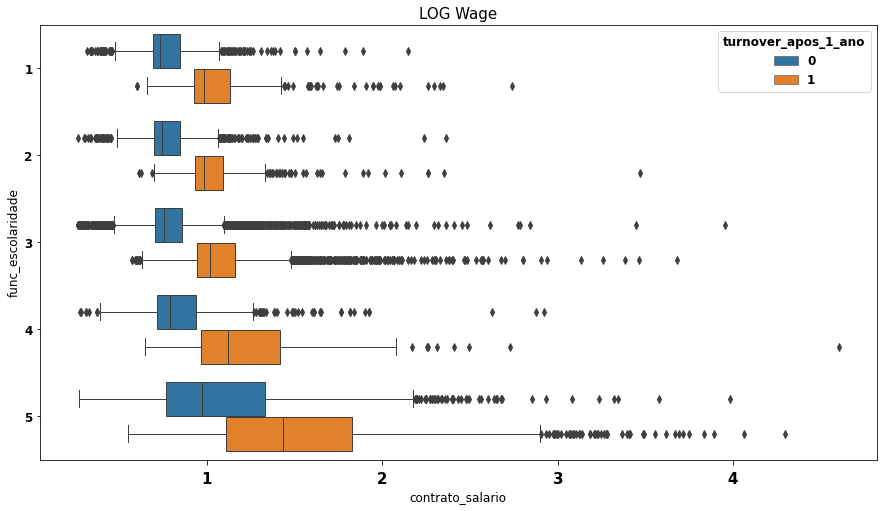

In [277]:
plt.figure(figsize=(15, 8))
ax = sns.boxplot(data=df_train, x = np.log1p(df_train.contrato_salario) , y = 'func_escolaridade', hue = 'turnover_apos_1_ano', orient="h",)\
                 .set_title(f'LOG Wage', fontsize=15)

#### OBS
* There is a interesting behaviour when the education level is 5: The wage intersect (when there is churn or not) is higher. Despite that fact, it can be observed from ANOVA that there is a distinction in the comparison between both


In [235]:
# Anova to compare churn and no churn for level of education 5
df_anova = df_train.loc[df_train.func_escolaridade == 5]
df_anova = pd.DataFrame(stats.f_oneway(df_anova.loc[df_anova.turnover_apos_1_ano == 0],
              df_anova.loc[df_anova.turnover_apos_1_ano == 1])[1],
             index = df_train.columns,
                       columns = ['p_value'])

def func_anova(x):
    if x >= 0.05:
        return '='
    else:
        return 'distinct'


df_anova['ANOVA'] = df_anova['p_value'].map(func_anova)
df_anova

,p_value,ANOVA
func_sexo,8.588195e-01,=
func_idade,2.607374e-19,distinct
func_racacor,9.418700e-06,distinct
func_escolaridade,NaN,distinct
func_uf,1.932252e-02,distinct
func_deficiencia,1.526273e-01,=
empresa_porte,3.434661e-14,distinct
empresa_setor,4.222959e-05,distinct
contrato_horastrabalho,1.985680e-08,distinct
contrato_salario,9.970369e-40,distinct


### 1.4.5. Company Size x Wage

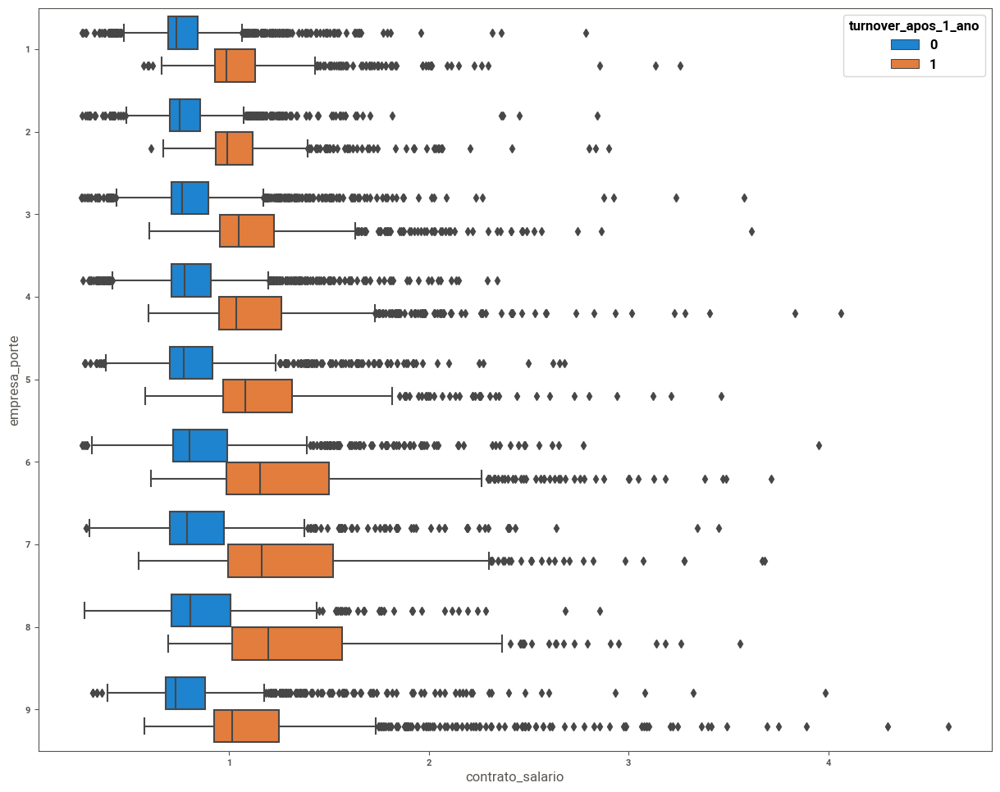

In [95]:
plt.figure(figsize=(15, 12))
ax = sns.boxplot(data=df_train, x = np.log1p(df_train.contrato_salario) , y = 'empresa_porte', hue = 'turnover_apos_1_ano', orient="h",)

### 1.4.6. Sector x Wage

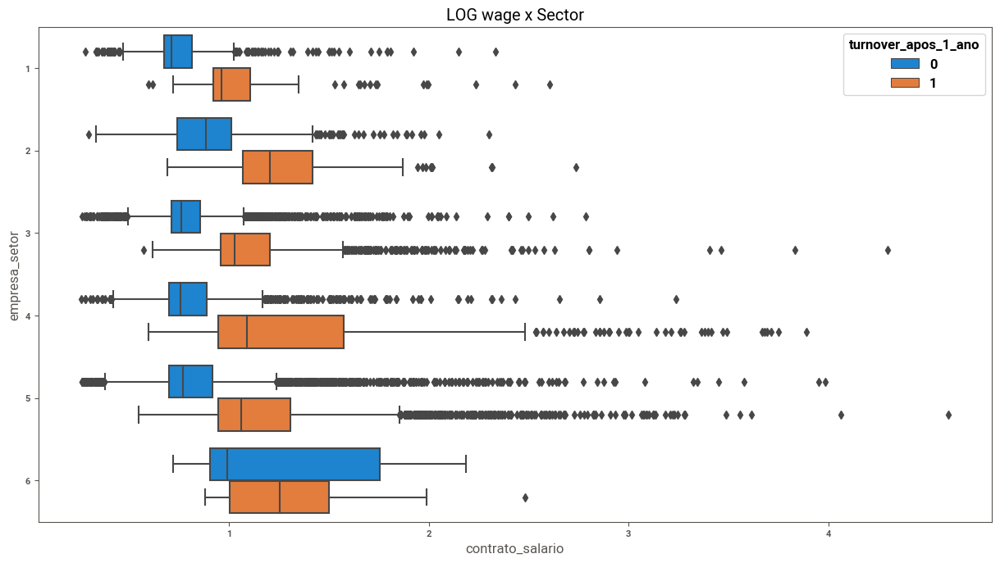

In [96]:
plt.figure(figsize=(15, 8))
ax = sns.boxplot(data=df_train, x = np.log1p(df_train.contrato_salario) , 
                 y = 'empresa_setor', hue = 'turnover_apos_1_ano', orient="h",).set_title('LOG wage x Sector')

#### OBS
* When sector is 6 (Public Administration), there is a huge difference from the others which could be a result of few data 

### 1.4.7. State x Wage

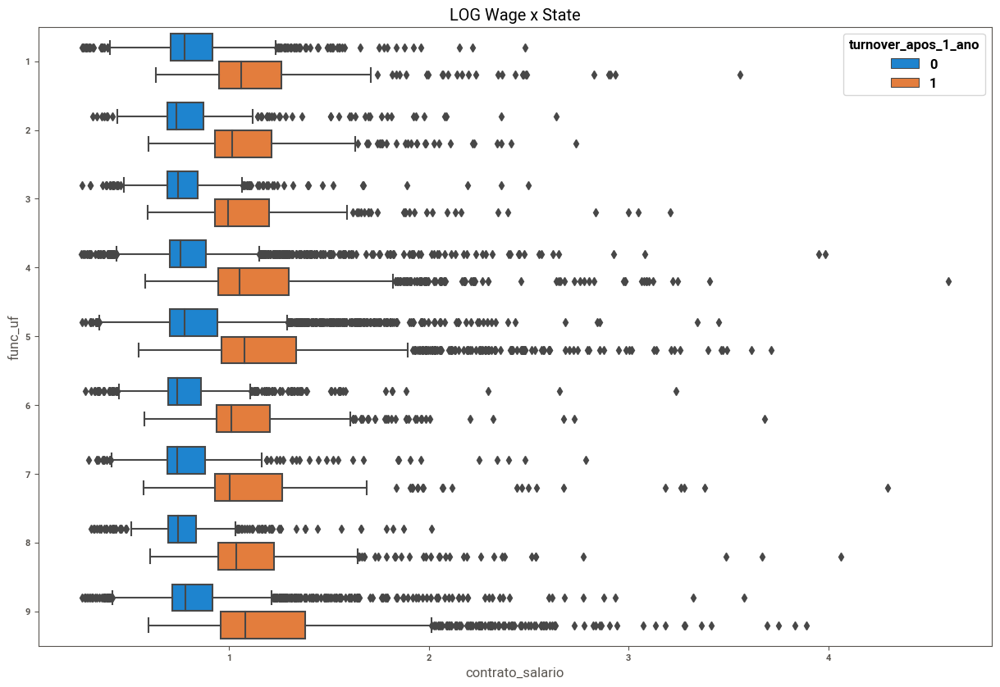

In [97]:
plt.figure(figsize=(15, 10))
ax = sns.boxplot(data=df_train, x = np.log1p(df_train.contrato_salario) , 
                 y = 'func_uf', hue = 'turnover_apos_1_ano', 
                 orient="h",).set_title('LOG Wage x State')

### 1.4.8. Age x Wage

<Figure size 1500x500 with 0 Axes>

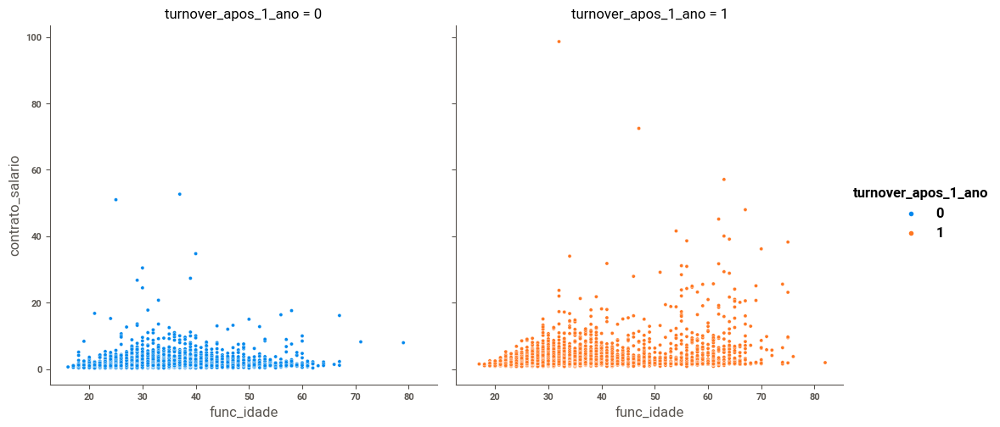

In [99]:
plt.figure(figsize=(15,5))
sns.relplot(data=df_train, x="func_idade", y="contrato_salario", hue =  'turnover_apos_1_ano',
               col =  'turnover_apos_1_ano',)

#### OBS:
* When wage is higher, it can be noted that when there is a churn, the age is also higher. 
* On the other hand, for no churn data, the age is lower, especially when looking at outliers.

### 1.4.9. Work hours x Wage

<Figure size 1500x500 with 0 Axes>

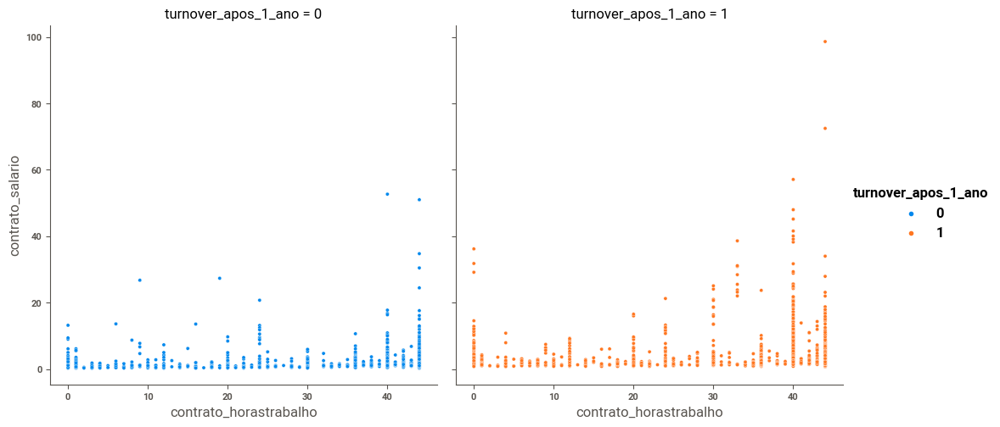

In [100]:
plt.figure(figsize=(15,5))
sns.relplot(data=df_train, x="contrato_horastrabalho", y="contrato_salario", hue =  'turnover_apos_1_ano',
               col =  'turnover_apos_1_ano', )
            


## <font color=blue> 2. EDA - func_idade

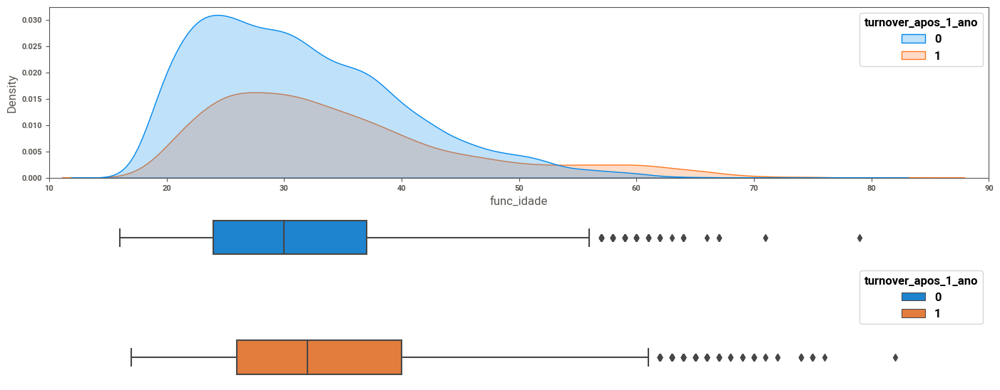

In [102]:
fig = plt.figure(figsize=(17, 7))
grid = GridSpec(nrows=2, ncols=1, figure=fig)

ax0 = fig.add_subplot(grid[0, :])
sns.kdeplot(data=df_train, x="func_idade", hue="turnover_apos_1_ano", multiple="layer", 
           fill=True, ax=ax0
           )
ax0.set_xlim(left=10, right=90)



ax1 = fig.add_subplot(grid[1, :])
plt.axis('off')
sns.boxplot(data=df_train, x = df_train.func_idade, y = 'turnover_apos_1_ano', 
                 hue = 'turnover_apos_1_ano', 
            orient="h",ax=ax1)
ax1.set_xlim(left=10, right=90)
plt.show()

* It can be highlighted that when age is below 55, there are more no churn data. However, when the age is above that mark, the churn exceeds the no churn.

Skewness for Age =======>>> 1.075
Skewness for Age - No Churn =======>>> 0.827
Skewness for Age - Churn =======>>> 1.107


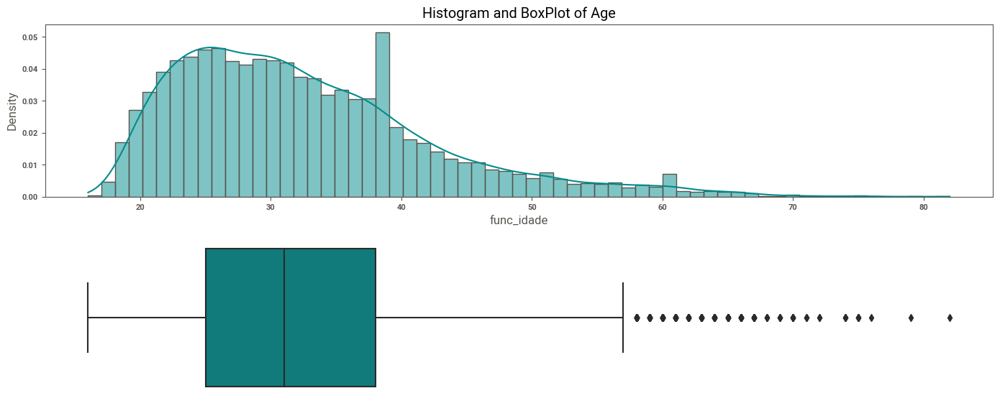

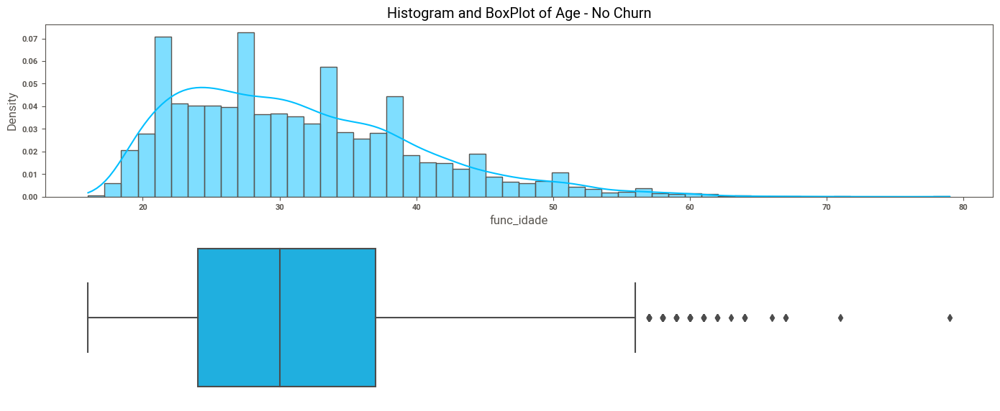

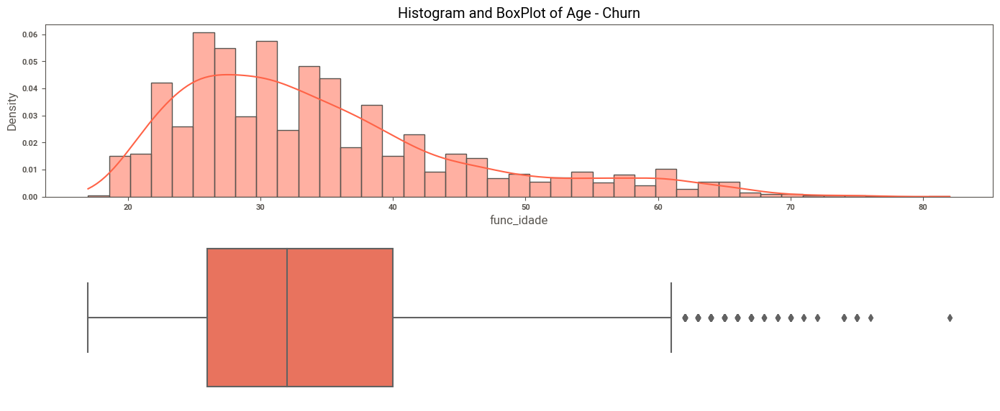

In [104]:
distribution_plot(df_train['func_idade'], 'Age', color='darkcyan')
distribution_plot(df_train.loc[df_train.turnover_apos_1_ano==0]['func_idade'], 'Age - No Churn')
distribution_plot(df_train.loc[df_train.turnover_apos_1_ano==1]['func_idade'], 'Age - Churn', color='tomato')



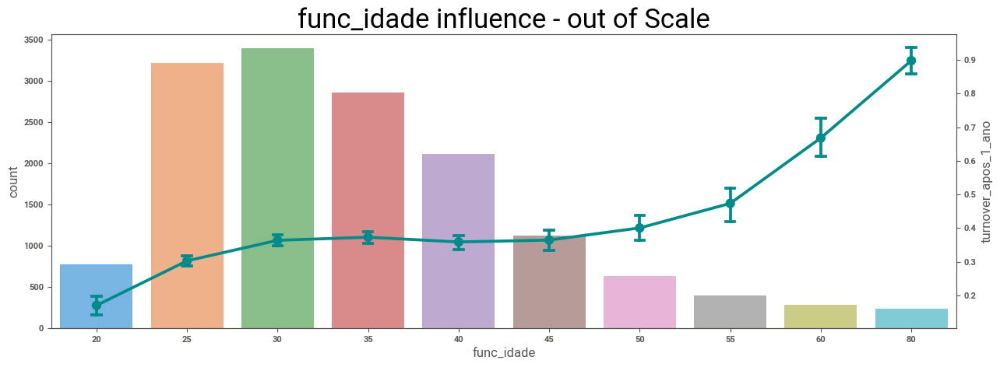

In [105]:
def age_plot(data, color = 'darkcyan', hue = None): 
    
    col_name = 'func_idade'
    age_data = data[[col_name, 'turnover_apos_1_ano']]
    age_data[col_name] = pd.cut(age_data[col_name],
                               bins=[0, 20, 25, 30, 35, 40 , 45, 50, 55, 60, 80],
                               labels=[ 20, 25, 30, 35, 40 , 45, 50, 55, 60, 80])

    ax1 = sns.set_style(style=None, rc=None)

    fig, ax1 = plt.subplots(figsize=(15,5))

    sns.countplot(x=col_name, data=age_data, ax = ax1, alpha=0.6) \
                 .set_title(f'{col_name} influence - out of Scale', fontsize=25)
    

    ax2 = ax1.twinx()
    sns.pointplot(x=col_name, y='turnover_apos_1_ano',
                  dodge=0.1, capsize=.1, data=age_data, color=color, hue=hue, row=hue, ax = ax2) 
    
    
age_plot(df_train)

### Wage x Age

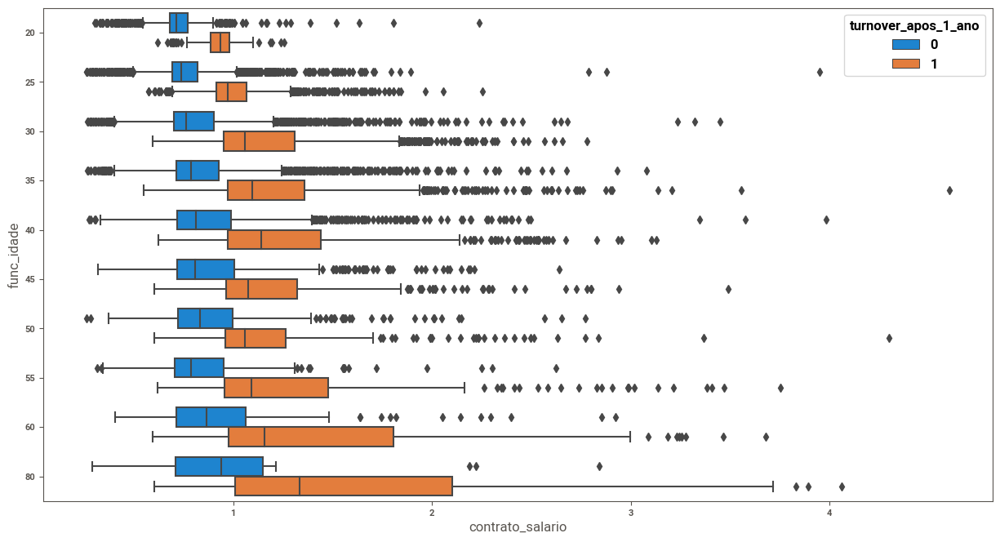

In [106]:
age_data = df_train[['func_idade', 'turnover_apos_1_ano', 'contrato_salario']]
age_data['func_idade'] = pd.cut(age_data['func_idade'],
                               bins=[0, 20, 25, 30, 35, 40 , 45, 50, 55, 60, 80],
                               labels=[ 20, 25, 30, 35, 40 , 45, 50, 55, 60, 80])

plt.figure(figsize=(15, 8))
ax = sns.boxplot(data=age_data, x = np.log1p(age_data.contrato_salario) , y = 'func_idade', hue = 'turnover_apos_1_ano', orient="h",)

### Escolar x Age

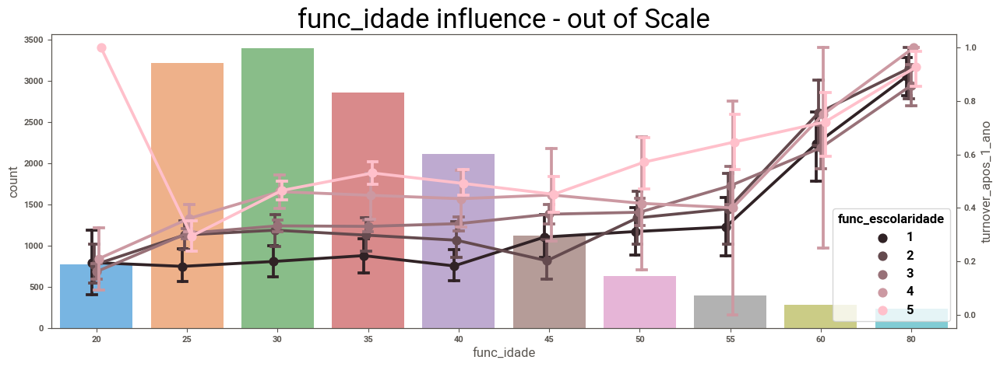

In [107]:
age_plot(df_train, color='pink', hue = df_train.func_escolaridade)

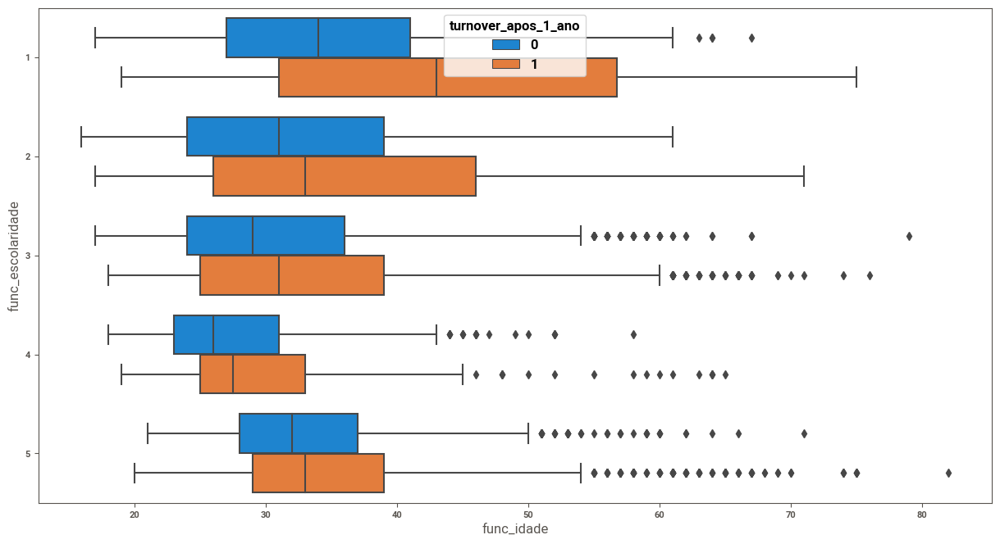

In [108]:
plt.figure(figsize=(15, 8))
ax = sns.boxplot(data=df_train, x = 'func_idade' , y = 'func_escolaridade', hue = 'turnover_apos_1_ano', orient="h",)

### Race x Age

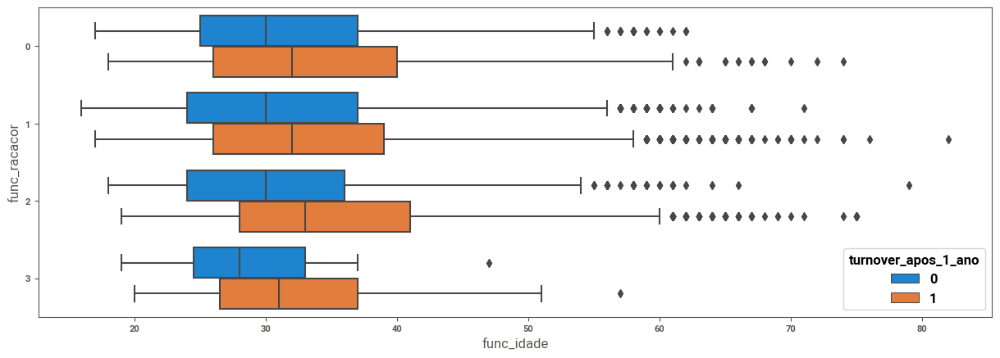

In [110]:
plt.figure(figsize=(15, 5))
ax = sns.boxplot(data=df_train, x = 'func_idade' , y = 'func_racacor', hue = 'turnover_apos_1_ano', orient="h",)

### Company Size x Age

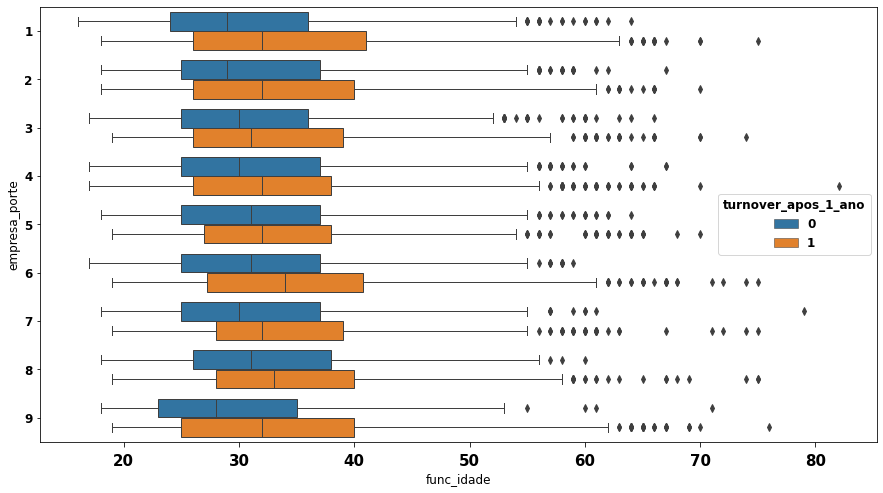

In [292]:
plt.figure(figsize=(15, 8))
ax = sns.boxplot(data=df_train, x = 'func_idade' , y = 'empresa_porte', hue = 'turnover_apos_1_ano', orient="h",)

### Company Sector x Age

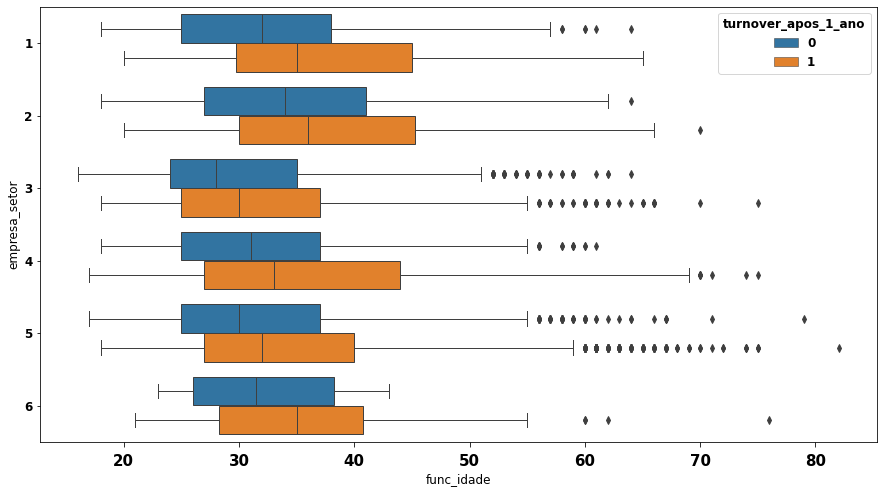

In [294]:
plt.figure(figsize=(15, 8))
ax = sns.boxplot(data=df_train, x = 'func_idade' , y = 'empresa_setor', hue = 'turnover_apos_1_ano', orient="h",)

### State x Age

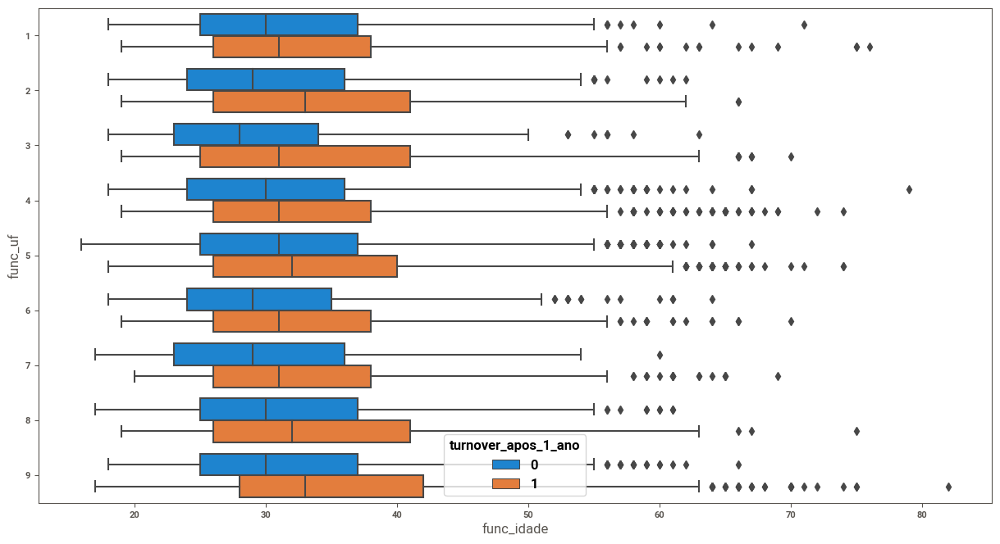

In [111]:
plt.figure(figsize=(15, 8))
ax = sns.boxplot(data=df_train, x = 'func_idade' , y = 'func_uf', hue = 'turnover_apos_1_ano', orient="h",)

## <font color=blue> 3. EDA - Work Hours

<AxesSubplot:xlabel='contrato_horastrabalho', ylabel='Density'>

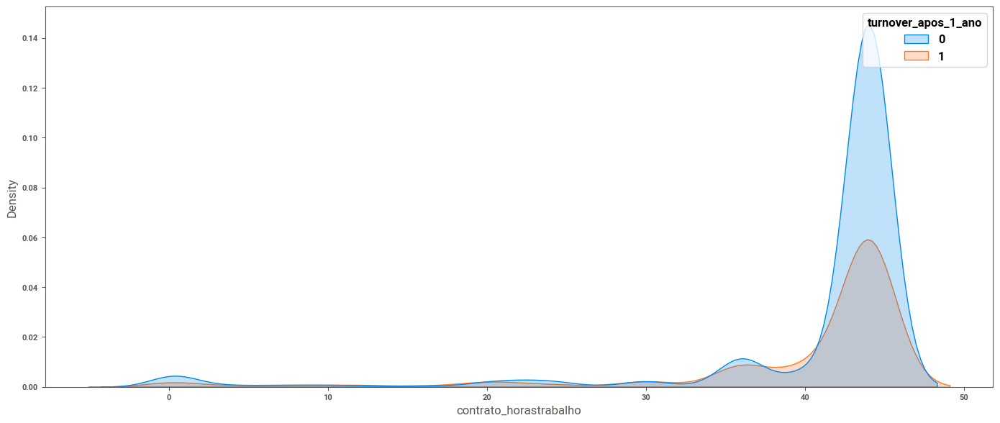

In [112]:
plt.figure(figsize=(17, 7))
sns.kdeplot(data=df_train, x="contrato_horastrabalho", hue="turnover_apos_1_ano", multiple="layer", 
           fill=True
           )

* From the distribution plot, it can be noted that the churn rate varies along the work hours

Skewness for Work hours =======>>> -3.143
Skewness for Work hours - No Churn =======>>> -3.398
Skewness for Work hours - Churn =======>>> -2.770


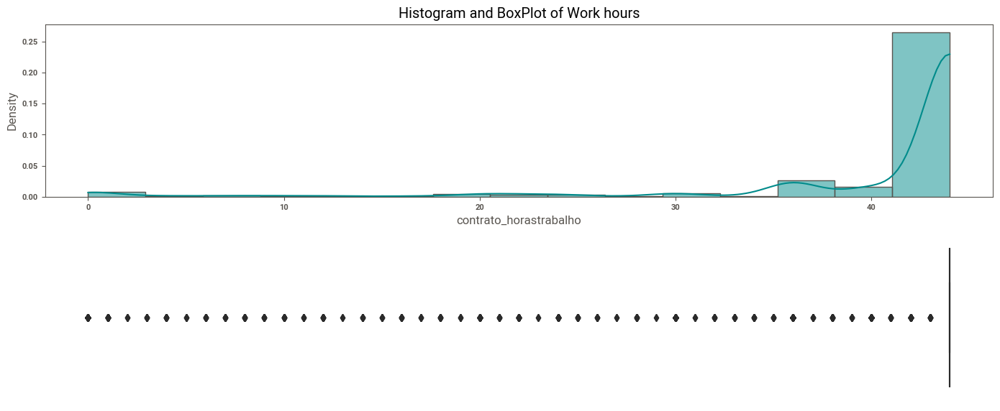

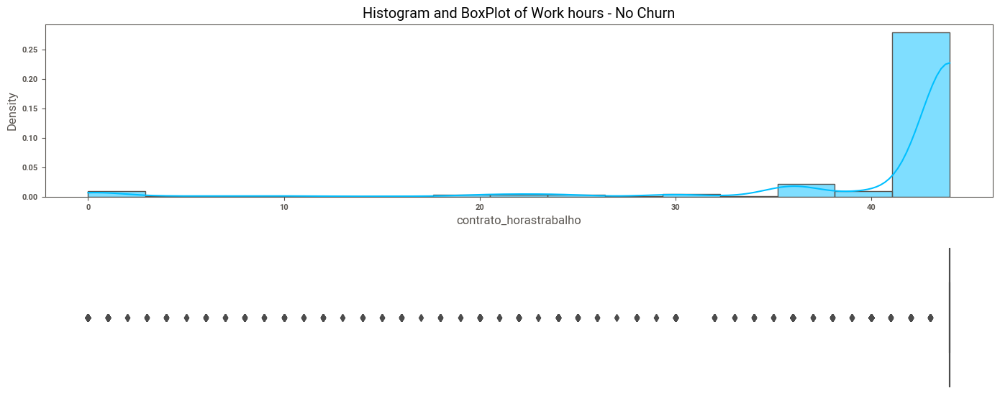

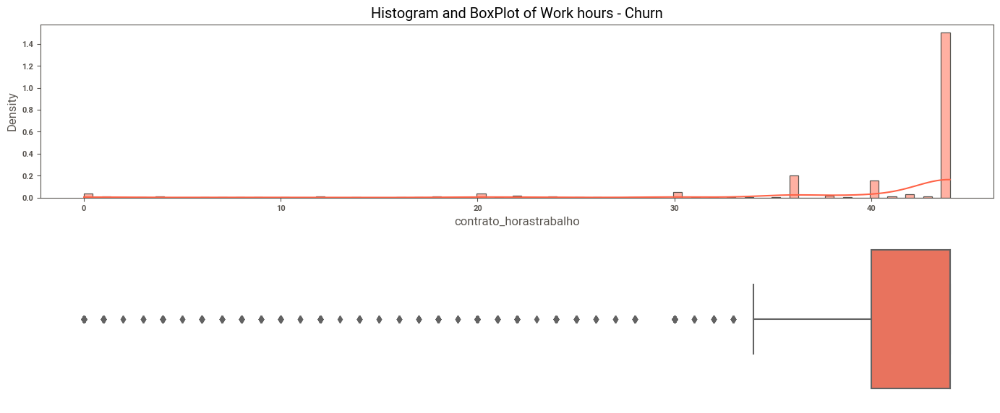

In [113]:
distribution_plot(df_train['contrato_horastrabalho'], 'Work hours', color='darkcyan')
distribution_plot(df_train.loc[df_train.turnover_apos_1_ano==0]['contrato_horastrabalho'], 'Work hours - No Churn')
distribution_plot(df_train.loc[df_train.turnover_apos_1_ano==1]['contrato_horastrabalho'], 'Work hours - Churn', color='tomato')

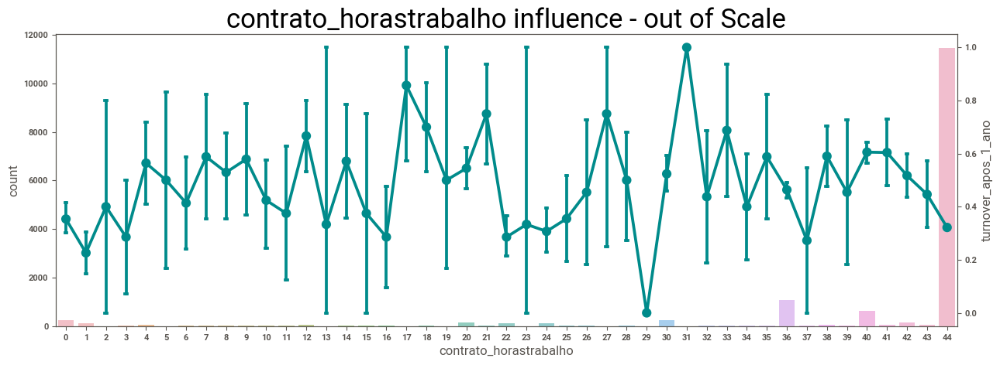

In [114]:
def work_hours_plot(data, color = 'darkcyan', hue = None): 
    
    col_name = 'contrato_horastrabalho'
    age_data = data[[col_name, 'turnover_apos_1_ano']]
    #age_data[col_name] = pd.cut(age_data[col_name],
     #                          bins=[-1, 0, 1, 2, 3, 4, 5, 10, 15, 20, 25, 30, 35, 40, 41, 42, 43, 44],
      #                         labels=[ 0, 1, 2, 3, 4, 5, 10, 15, 20, 25, 30, 35, 40, 41, 42, 43, 44])

    ax1 = sns.set_style(style=None, rc=None)

    fig, ax1 = plt.subplots(figsize=(15,5))

    sns.countplot(x=col_name, data=age_data, ax = ax1, alpha=0.6) \
                 .set_title(f'{col_name} influence - out of Scale', fontsize=25)
    

    ax2 = ax1.twinx()
    sns.pointplot(x=col_name, y='turnover_apos_1_ano',
                  dodge=0.1, capsize=.1, data=age_data, color=color, hue=hue, row=hue, ax = ax2) 
    
    
work_hours_plot(df_train)

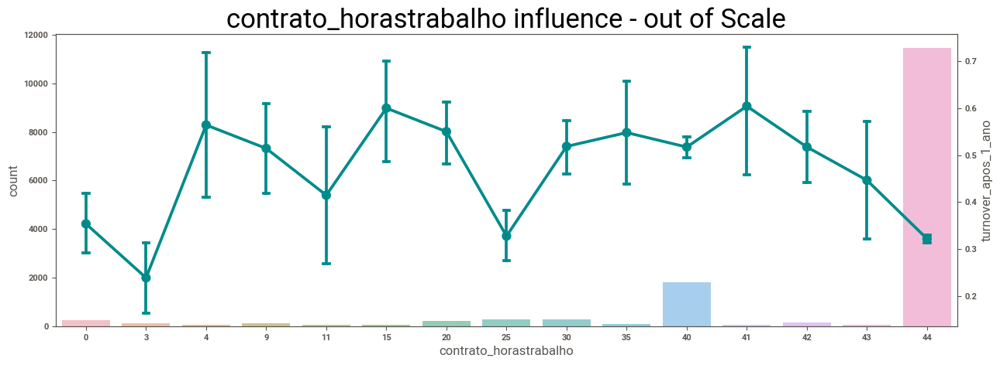

In [115]:
def work_hours_plot(data, color = 'darkcyan', hue = None): 
    
    col_name = 'contrato_horastrabalho'
    age_data = data[[col_name, 'turnover_apos_1_ano']]
    age_data[col_name] = pd.cut(age_data[col_name],
                               bins=[-1, 0, 3, 4, 9, 11, 15, 20, 25, 30, 35, 40, 41, 42, 43, 44],
                               labels=[ 0, 3, 4, 9, 11, 15, 20, 25, 30, 35, 40, 41, 42, 43, 44])

    ax1 = sns.set_style(style=None, rc=None)

    fig, ax1 = plt.subplots(figsize=(15,5))

    sns.countplot(x=col_name, data=age_data, ax = ax1, alpha=0.6) \
                 .set_title(f'{col_name} influence - out of Scale', fontsize=25)
    

    ax2 = ax1.twinx()
    sns.pointplot(x=col_name, y='turnover_apos_1_ano',
                  dodge=0.1, capsize=.1, data=age_data, color=color, hue=hue, row=hue, ax = ax2) 
    
    
work_hours_plot(df_train)

## <font color=blue> 4. EDA - Company Size

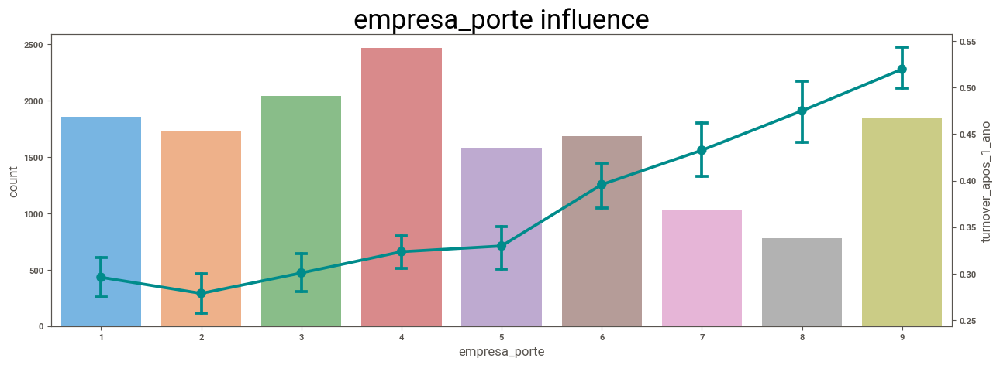

In [116]:
def size_plot(data, color = 'darkcyan', hue = None): 
    
    col_name = 'empresa_porte'
    age_data = data[[col_name, 'turnover_apos_1_ano']]
    
    ax1 = sns.set_style(style=None, rc=None)

    fig, ax1 = plt.subplots(figsize=(15,5))

    sns.countplot(x=col_name, data=age_data, ax = ax1, alpha=0.6) \
                 .set_title(f'{col_name} influence', fontsize=25)
    

    ax2 = ax1.twinx()
    sns.pointplot(x=col_name, y='turnover_apos_1_ano',
                  dodge=0.1, capsize=.1, data=age_data, color=color, hue=hue, row=hue, ax = ax2) 
    
    
size_plot(df_train)

* It can be observed a rising trend in the churn rate when the company size gets bigger

##  <font color=blue>  5. EDA - State

In [121]:
df_states = pd.DataFrame(df_states.groupby(['func_uf', 'latitude', 'longitude']).mean()).reset_index().round(2)
center_map = {'lat':df_states.latitude.mean(), 'lon':df_states.longitude.mean()}
map_state = px.scatter_mapbox(df_states, lat='latitude', lon='longitude',size=(df_states.contrato_salario)*1000, #radius=25,
                         title = 'Churn rate by state',
                         color_continuous_scale=px.colors.cyclical.IceFire, size_max=15,
                         color = 'turnover_apos_1_ano',
                         hover_name = 'func_uf',
                        center=center_map, zoom=4.2,
                        mapbox_style='stamen-terrain',
                    
                        hover_data  = ['contrato_salario', 'func_idade', 'func_sexo', 'func_escolaridade'])
                     
map_state.show()

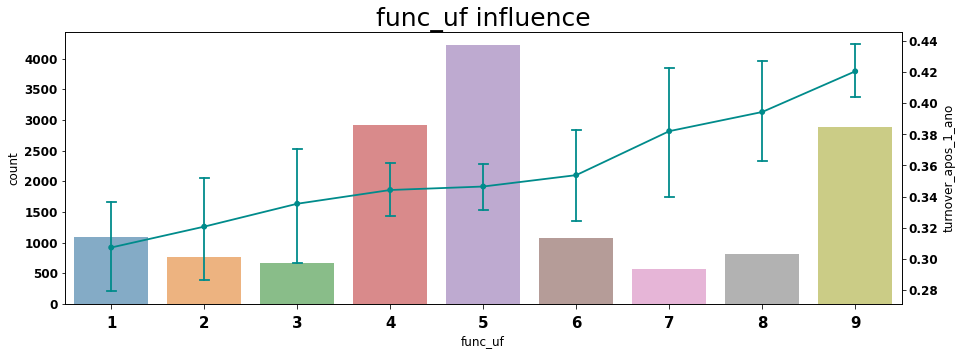

In [100]:
def state_plot(data, color = 'darkcyan', hue = None): 
    
    col_name = 'func_uf'
    age_data = data[[col_name, 'turnover_apos_1_ano']]
    
    ax1 = sns.set_style(style=None, rc=None)

    fig, ax1 = plt.subplots(figsize=(15,5))

    sns.countplot(x=col_name, data=age_data, ax = ax1, alpha=0.6) \
                 .set_title(f'{col_name} influence', fontsize=25)
    

    ax2 = ax1.twinx()
    sns.pointplot(x=col_name, y='turnover_apos_1_ano',
                  dodge=0.1, capsize=.1, data=age_data, color=color, hue=hue, row=hue, ax = ax2) 
    
    
state_plot(df_train)

##  <font color=blue>  6. EDA - Company Sector

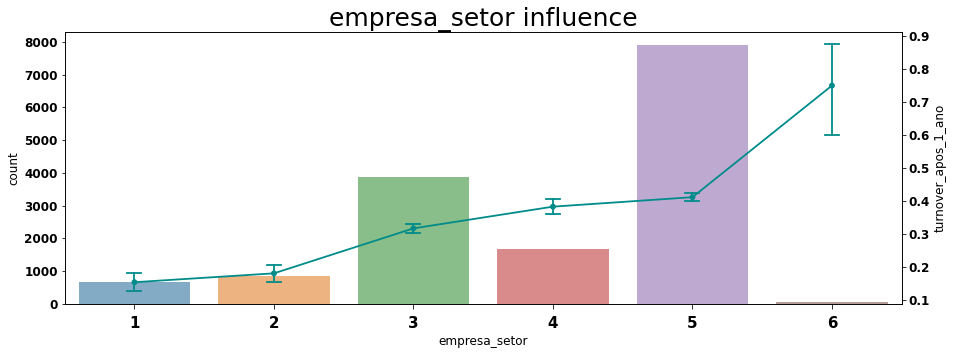

In [101]:
def field_plot(data, color = 'darkcyan', hue = None): 
    
    col_name = 'empresa_setor'
    age_data = data[[col_name, 'turnover_apos_1_ano']]
    
    ax1 = sns.set_style(style=None, rc=None)

    fig, ax1 = plt.subplots(figsize=(15,5))

    sns.countplot(x=col_name, data=age_data, ax = ax1, alpha=0.6) \
                 .set_title(f'{col_name} influence', fontsize=25)
    

    ax2 = ax1.twinx()
    sns.pointplot(x=col_name, y='turnover_apos_1_ano',
                  dodge=0.1, capsize=.1, data=age_data, color=color, hue=hue, row=hue, ax = ax2) 
    
    
field_plot(df_train)

In [78]:
df_train.loc[df_train.empresa_setor==6].sort_values(
    by = ['func_escolaridade', 'func_idade', 'func_racacor', 'func_uf', 'func_deficiencia', 
          'empresa_porte', 'empresa_setor','contrato_horastrabalho', 
          'contrato_salario','func_sexo', 'turnover_apos_1_ano']).head(50)

,func_sexo,func_idade,func_racacor,func_escolaridade,func_uf,func_deficiencia,empresa_porte,empresa_setor,contrato_horastrabalho,contrato_salario,turnover_apos_1_ano,func_idade_faixa
8632,1,43,1,1,5,0,9,6,44,1.51826,0,6
10587,1,60,1,1,4,0,8,6,40,1.81677,1,9
356,0,21,0,3,5,0,2,6,44,1.82789,1,2
622,0,21,2,3,6,0,4,6,44,1.56316,1,2
3863,1,23,2,3,5,0,9,6,44,1.45835,0,2
8368,1,24,2,3,5,0,9,6,44,2.56320,0,2
13816,0,26,1,3,6,0,4,6,44,1.60362,1,3
12652,0,27,1,3,5,0,9,6,40,1.69151,1,3
5132,0,29,1,3,5,0,9,6,44,1.62138,0,3
1547,0,29,1,3,5,0,9,6,44,2.76965,1,3


##  <font color=blue>  7. EDA - Level of Education

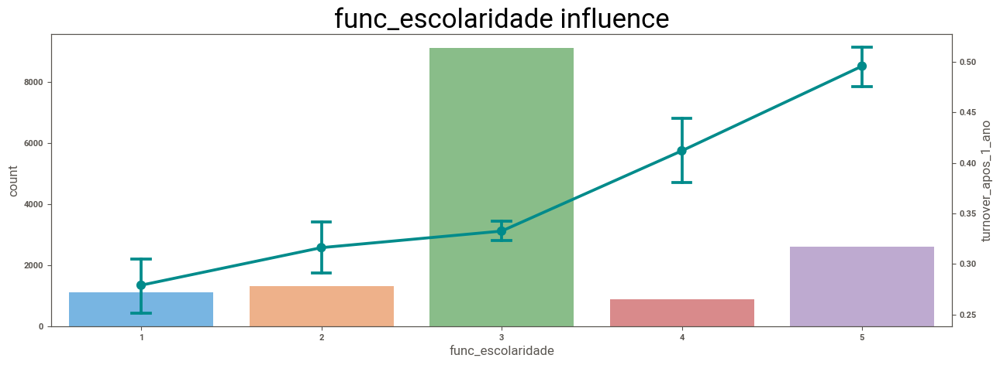

In [122]:
def education_plot(data, color = 'darkcyan', hue = None): 
    
    col_name = 'func_escolaridade'
    age_data = data[[col_name, 'turnover_apos_1_ano']]
    
    ax1 = sns.set_style(style=None, rc=None)

    fig, ax1 = plt.subplots(figsize=(15,5))

    sns.countplot(x=col_name, data=age_data, ax = ax1, alpha=0.6) \
                 .set_title(f'{col_name} influence', fontsize=25)
    

    ax2 = ax1.twinx()
    sns.pointplot(x=col_name, y='turnover_apos_1_ano',
                  dodge=0.1, capsize=.1, data=age_data, color=color, hue=hue, row=hue, ax = ax2) 
    
    
education_plot(df_train)

#### OBS
- It can be noted that the turnover rate increases along with the education level

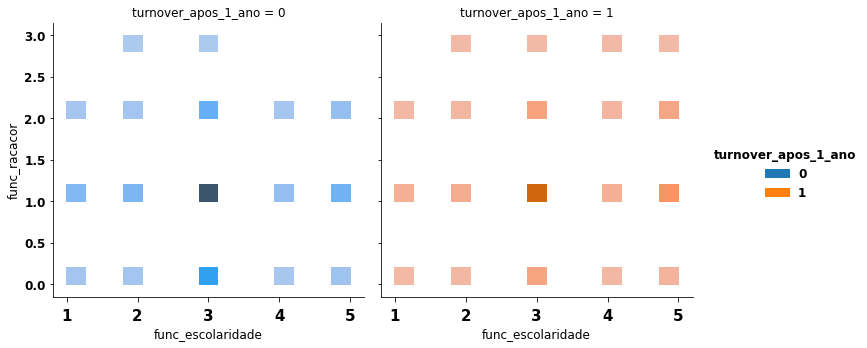

In [31]:
sns.displot(data=df_train, x="func_escolaridade", y="func_racacor", col = 'turnover_apos_1_ano', hue =  'turnover_apos_1_ano', 
            aspect = 1, #palette = 'Greens'
           )

* When race is 3 (ndian-Native) and level of education is higher than 3 (>3), the person left the company. Nevertheless, it should be take into account that there are few data about it. 


##  <font color=blue>  8. EDA - Race

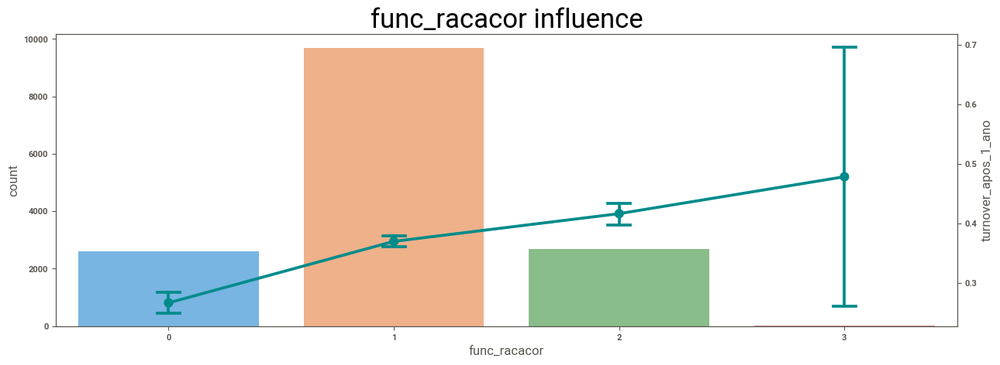

In [123]:
def race_plot(data, color = 'darkcyan', hue = None): 
    
    col_name = 'func_racacor'
    age_data = data[[col_name, 'turnover_apos_1_ano']]
    
    ax1 = sns.set_style(style=None, rc=None)

    fig, ax1 = plt.subplots(figsize=(15,5))

    sns.countplot(x=col_name, data=age_data, ax = ax1, alpha=0.6) \
                 .set_title(f'{col_name} influence', fontsize=25)
    

    ax2 = ax1.twinx()
    sns.pointplot(x=col_name, y='turnover_apos_1_ano',
                  dodge=0.1, capsize=.1, data=age_data, color=color, hue=hue, row=hue, ax = ax2) 
    
    
race_plot(df_train)

In [99]:
# Anova to campare train and test data when race is 3 (Indian-Native)
df_ = df_train.drop(columns = ['turnover_apos_1_ano'], axis=1)
df_anova = pd.DataFrame(stats.f_oneway(df_.loc[df_.func_racacor == 3],
              df_test.loc[(df_test.func_racacor == 3)])[1],
             index = df_.columns,
                       columns = ['p_value'])

def func_anova(x):
    if x >= 0.05:
        return '='
    else:
        return 'distinct'


df_anova['ANOVA'] = df_anova['p_value'].map(func_anova)
df_anova

,p_value,ANOVA
func_sexo,0.393037,=
func_idade,0.686091,=
func_racacor,NaN,distinct
func_escolaridade,0.893448,=
func_uf,0.899093,=
func_deficiencia,NaN,distinct
empresa_porte,0.845756,=
empresa_setor,0.457829,=
contrato_horastrabalho,0.176201,=
contrato_salario,0.461279,=


In [127]:
df_anova = pd.DataFrame(stats.f_oneway(df_train.loc[df_train.func_racacor == 3],
              df_train.loc[(df_train.func_racacor == 2)])[1],
             index = df_train.columns,
                       columns = ['p_value'])

def func_anova(x):
    if x >= 0.05:
        return '='
    else:
        return 'distinct'


df_anova['ANOVA'] = df_anova['p_value'].map(func_anova)
df_anova

,p_value,ANOVA
func_sexo,0.380922,=
func_idade,0.443298,=
func_racacor,0.000000,distinct
func_escolaridade,0.102773,=
func_uf,0.784234,=
func_deficiencia,0.488112,=
empresa_porte,0.278369,=
empresa_setor,0.377781,=
contrato_horastrabalho,0.811538,=
contrato_salario,0.968960,=


* From the Dataframe above, it can be noted that there is a difference bettwen the categories analyzed. Therefor, we can join both into one set

##  <font color=blue>  9. EDA - Sex

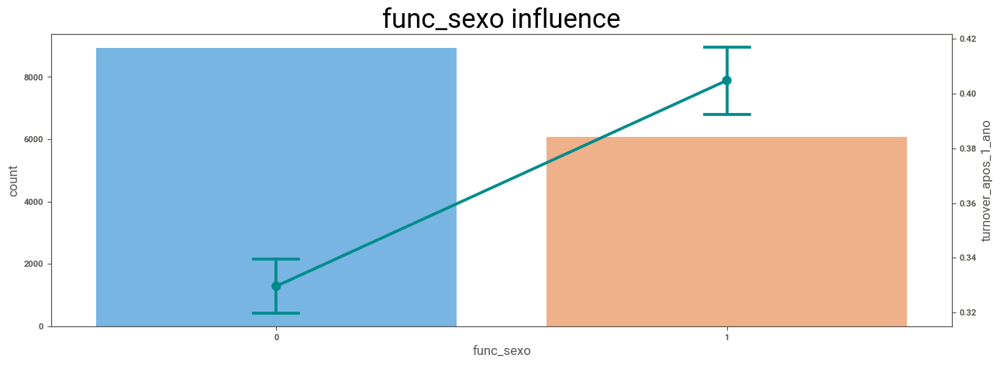

In [128]:
def sex_plot(data, color = 'darkcyan', hue = None): 
    
    col_name = 'func_sexo'
    age_data = data[[col_name, 'turnover_apos_1_ano']]
    
    ax1 = sns.set_style(style=None, rc=None)

    fig, ax1 = plt.subplots(figsize=(15,5))

    sns.countplot(x=col_name, data=age_data, ax = ax1, alpha=0.6) \
                 .set_title(f'{col_name} influence', fontsize=25)
    

    ax2 = ax1.twinx()
    sns.pointplot(x=col_name, y='turnover_apos_1_ano',
                  dodge=0.1, capsize=.1, data=age_data, color=color, hue=hue, row=hue, ax = ax2) 
    
    
sex_plot(df_train)

In [129]:
# Anova
df_anova = pd.DataFrame(stats.f_oneway(df_train.loc[df_train.func_sexo == 0],
              df_train.loc[df_train.func_sexo == 1])[1],
             index = df_train.columns,
                       columns = ['p_value'])

def func_anova(x):
    if x >= 0.05:
        return '='
    else:
        return 'distinct'


df_anova['ANOVA'] = df_anova['p_value'].map(func_anova)
df_anova

,p_value,ANOVA
func_sexo,0.000000e+00,distinct
func_idade,1.640017e-10,distinct
func_racacor,2.457634e-08,distinct
func_escolaridade,3.188710e-162,distinct
func_uf,3.615549e-01,=
func_deficiencia,7.924853e-01,=
empresa_porte,8.834562e-01,=
empresa_setor,1.135988e-108,distinct
contrato_horastrabalho,1.349943e-28,distinct
contrato_salario,1.405101e-05,distinct


* Based on the ANOVA test, there is a difference when the person is female and male. Thus, we have to use this feature in our model

##  <font color=blue>  10. EDA - Deficiency

In [189]:
# Anova
df_anova = pd.DataFrame(stats.f_oneway(df_train.loc[df_train.func_deficiencia == 0],
              df_train.loc[df_train.func_deficiencia == 1])[1],
             index = df_train.columns,
                       columns = ['p_value'])

def func_anova(x):
    if x >= 0.05:
        return '='
    else:
        return 'distinct'


df_anova['ANOVA'] = df_anova['p_value'].map(func_anova)
df_anova

,p_value,ANOVA
func_sexo,7.924853e-01,=
func_idade,3.460047e-08,distinct
func_racacor,9.853987e-03,distinct
func_escolaridade,6.586457e-02,=
func_uf,2.192652e-02,distinct
func_deficiencia,0.000000e+00,distinct
empresa_porte,1.209266e-32,distinct
empresa_setor,5.517102e-02,=
contrato_horastrabalho,2.828335e-02,distinct
contrato_salario,8.472239e-04,distinct


* According to the ANOVA hypotesis test, there is a difference between the 2 